# Блок 2. Исследовательский анализ данных (EDA)

## Описание блока:
В данном блоке будет проведена предобработка данных, где датасеты будут приведены в формат временного ряда и исправлены локальные проблемы при их загрузке из файлов. Будет проведено исследование каждого датастеа на волатильность, шумность, различные статистические тесты на стационарость и т.д. Будет подготовлена отдельная фукнция для пердобработки данны (в отдельном .py файле) для дальнейшего использования. Подробные выводы и подробное текстовое описание результатов будет в основной тетрадке [Открыть тетрадку "Part 0"](Part%200.%20Research%20results.ipynb)

In [1]:
# импорт основных библиотек блока
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
from pandas.plotting import autocorrelation_plot

from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import adfuller

from all_functions.datasets_load import load_all_datasets

In [2]:
# фиксация сида на будущее
RANDOM_STATE = 654321

In [3]:
# загрузка датасетов
crypt_Ethereum, crypt_BTC, futures_Brent_LCOK5, \
futures_WTI_CLJ5, share_metal_jiangxi_copper, \
share_metal_baoshan_iron, share_oil_petrochina_hk, \
share_oil_equinor_oslo, spot_preciouse_metal_AG, spot_preciouse_metal_AU = load_all_datasets()

## Предобработка данных

In [4]:
def clean_ohlcv_dataframe(df: pd.DataFrame) -> pd.DataFrame:
    # Найти тикер по колонке Close_*
    close_col = [col for col in df.columns if col.startswith('Close_')]
    if not close_col:
        raise ValueError("Не найдена колонка с Close_")
    ticker = close_col[0].split('_')[1]  # получаем "0358.HK" и т.п.

    # Переименование колонок
    rename_map = {
        f'Date': 'Дата',
        f'Close_{ticker}': 'Цена',
        f'Open_{ticker}': 'Откр.',
        f'High_{ticker}': 'Макс.',
        f'Low_{ticker}': 'Мин.',
        f'Volume_{ticker}': 'Объём',
    }
    df = df.rename(columns=rename_map)

    # Добавим колонку "Изм. %"
    df['Изм. %'] = df['Цена'].pct_change() * 100

    # Упорядочим колонки
    desired_order = ['Дата', 'Цена', 'Откр.', 'Макс.', 'Мин.', 'Объём', 'Изм. %']
    df = df[desired_order]

    return df

In [5]:
def transform_data(data):
    '''Фнукция для трансформации текстовых строчек в числовые'''
    # Унификация неймингов датасетов
    if "Дата" not in [x for x in data.columns]: data = clean_ohlcv_dataframe(data)
    
    # перевод даты в индексы датасета
    data["Дата"] = pd.to_datetime(data["Дата"], format='mixed', dayfirst=True, errors='coerce')
    data = data.sort_values("Дата").set_index("Дата")

    # меняем тип данных и удаляем заранее известные не информативные колонки
    for col in ["Цена", "Откр.", "Макс.", "Мин."]:
        if data[col].dtype == object or data[col].dtype.name == 'string':
            data[col] = data[col].str.replace(".", "", regex=False).str.replace(",", ".").astype(float)
        else:
            # если уже число — ничего не делаем
            data[col] = data[col].astype(float)

    data = data.drop(columns=["Объём", "Изм. %"], errors='ignore')

    #доп проверка на пустые строчки
    try:
        data.isnull().sum().sum() == 0
    except:
        print("В данных есть пустые значения!")

    data = data.drop_duplicates()

    # создаём новые фичи
    data = upgrade_dataset(data)
    
    return data

In [6]:
def upgrade_dataset(data_1):
    data = data_1.copy()

    # выводим фичи по дате
    data["День недели"] = data.index.dayofweek
    data["День"] = data.index.day
    data["Месяц"] = data.index.month
    data["Год"] = data.index.year

    # средние для цены (таргет) N дней назад
    data["lag_5_t"] = data["Цена"].shift(5)
    data["lag_15_t"] = data["Цена"].shift(15)
    data["lag_30_t"] = data["Цена"].shift(30)
    data["lag_90_t"] = data["Цена"].shift(90)
    data["lag_180_t"] = data["Цена"].shift(180)

    # средние для цены открытия N дней назад
    data["lag_5_open"] = data["Откр."].shift(5)
    data["lag_15_open"] = data["Откр."].shift(15)
    data["lag_30_open"] = data["Откр."].shift(30)
    data["lag_90_open"] = data["Откр."].shift(90)
    data["lag_180_open"] = data["Откр."].shift(180)

    # средние для макс. цены N дней назад
    data["lag_5_max"] = data["Макс."].shift(5)
    data["lag_15_max"] = data["Макс."].shift(15)
    data["lag_30_max"] = data["Макс."].shift(30)
    data["lag_90_max"] = data["Макс."].shift(90)
    data["lag_180_max"] = data["Макс."].shift(180)

    # средние для мин. цены N дней назад
    data["lag_5_min"] = data["Мин."].shift(5)
    data["lag_15_min"] = data["Мин."].shift(15)
    data["lag_30_min"] = data["Мин."].shift(30)
    data["lag_90_min"] = data["Мин."].shift(90)
    data["lag_180_min"] = data["Мин."].shift(180)

    # Цена в прошлом 5 и 15 дней от цены таргета
    data["diff_5_t"] = data["Цена"].diff(1).shift(1)
    data["diff_15_t"] = data["Цена"].diff(5).shift(1)

    data["diff_5_open"] = data["Откр."].diff(1).shift(1)
    data["diff_15_open"] = data["Откр."].diff(5).shift(1)

    data["diff_5_max"] = data["Макс."].diff(1).shift(1)
    data["diff_15_max"] = data["Макс."].diff(5).shift(1)
    
    data["diff_5_min"] = data["Мин."].diff(1).shift(1)
    data["diff_15_min"] = data["Мин."].diff(5).shift(1)
    
    # Волатильность, минимальная, максимальная цена за 5 дней
    data["rol_std_5"] = data["Цена"].rolling(window=5).std().shift(1)
    data["rol_min_5"] = data["Цена"].rolling(window=5).min().shift(1)
    data["rol_max_5"] = data["Цена"].rolling(window=5).max().shift(1)

    data["rol_std_5_open"] = data["Откр."].rolling(window=5).std().shift(1)
    data["rol_min_5_open"] = data["Откр."].rolling(window=5).min().shift(1)
    data["rol_max_5_open"] = data["Откр."].rolling(window=5).max().shift(1)

    data["rol_std_5_max"] = data["Макс."].rolling(window=5).std().shift(1)
    data["rol_min_5_max"] = data["Макс."].rolling(window=5).min().shift(1)
    data["rol_max_5_max"] = data["Макс."].rolling(window=5).max().shift(1)

    data["rol_std_5_min"] = data["Мин."].rolling(window=5).std().shift(1)
    data["rol_min_5_min"] = data["Мин."].rolling(window=5).min().shift(1)
    data["rol_max_5_min"] = data["Мин."].rolling(window=5).max().shift(1)


    # Волатильность, минимальная, максимальная за 15 дней
    data["rol_std_15"] = data["Цена"].rolling(window=15).std().shift(1)
    data["rol_min_15"] = data["Цена"].rolling(window=15).min().shift(1)
    data["rol_max_15"] = data["Цена"].rolling(window=15).max().shift(1)
    
    data["rol_std_15_open"] = data["Откр."].rolling(window=15).std().shift(1)
    data["rol_min_15_open"] = data["Откр."].rolling(window=15).min().shift(1)
    data["rol_max_15_open"] = data["Откр."].rolling(window=15).max().shift(1)
    
    data["rol_std_15_max"] = data["Макс."].rolling(window=15).std().shift(1)
    data["rol_min_15_max"] = data["Макс."].rolling(window=15).min().shift(1)
    data["rol_max_15_max"] = data["Макс."].rolling(window=15).max().shift(1)
    
    data["rol_std_15_min"] = data["Мин."].rolling(window=15).std().shift(1)
    data["rol_min_15_min"] = data["Мин."].rolling(window=15).min().shift(1)
    data["rol_max_15_min"] = data["Мин."].rolling(window=15).max().shift(1)


    data = data.dropna()
    
    return data

In [7]:
# трансформация датасетов
crypt_Ethereum = transform_data(crypt_Ethereum)
crypt_BTC = transform_data(crypt_BTC)

futures_WTI_CLJ5 = transform_data(futures_WTI_CLJ5)
futures_Brent_LCOK5 = transform_data(futures_Brent_LCOK5)

share_metal_jiangxi_copper  = transform_data(share_metal_jiangxi_copper)
share_metal_baoshan_iron  = transform_data(share_metal_baoshan_iron)

share_oil_petrochina_hk  = transform_data(share_oil_petrochina_hk)
share_oil_equinor_oslo  = transform_data(share_oil_equinor_oslo)

spot_preciouse_metal_AU  = transform_data(spot_preciouse_metal_AU)
spot_preciouse_metal_AG = transform_data(spot_preciouse_metal_AG)

## Исследование данных

In [8]:
def plot_lines(data, lines, title="", xlabel="Дата", ylabel="Значение", legend=True):
    plt.figure(figsize=(8, 6))
    for label, series in lines.items():
        plt.plot(data.index, series, label=label)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if legend:
        plt.legend()
    plt.grid()
    plt.show()


In [9]:
def plot_correlation_heatmap(df, title="Корреляция"):
    plt.figure(figsize=(12, 12))
    sns.heatmap(df.corr(), cmap="coolwarm", fmt=".2f")
    plt.title(title)
    plt.show()

In [10]:
def crate_base_research_data(name, data_1):
    '''Функция для проведения исследований датасетов'''

    line_length = 150
    print('-' * line_length)
    print(f'Обзор датасета: {name}'.center(line_length))
    print('-' * line_length)
    
    # Копия данных для внесения временных ихменений
    data = data_1.copy()
    
    ## Базовый просмотр статистики по датасету

    print("Статистика по данным")
    print(data_1.describe())

    # График цены за всё время
    plot_lines(data_1, {"Цена": data["Цена"]},  title = "Цена за день", ylabel = "Цена (USD)")

    print('-' * line_length)
    
    ## корреляция признаков
    plot_correlation_heatmap(data, "Корреляция признаков")

    plt.figure(figsize=(8, 6))
    autocorrelation_plot(data["Цена"])
    plt.title("Автокорриляция признаков")
    plt.show()

    # Дополнительный вариант автокорреляции
    plot_acf(data["Цена"], lags=50)
    plt.show()

    print('-' * line_length)
    
    ## Сезонная декомпозиция ряда, период - 30 дней
    print('Сезонная декомпозиция ряда, период - 30 дней')
    result = seasonal_decompose(data["Цена"], model="additive", period=30)
    result.plot()
    plt.show()

    ## Сезонная декомпозиция ряда, период - 90 дней
    print('Сезонная декомпозиция ряда, период - 90 дней')
    result = seasonal_decompose(data["Цена"], model="additive", period=90)
    result.plot()
    plt.show()

    print('-' * line_length)
    
    ##Изучение волатильности по ценам
    plot_lines(data_1, {"vol_5": data["rol_std_5"], "vol_5": data["rol_std_5"], "vol_15": data["rol_std_15"]},  title = "Волатильность стоимости актива", ylabel = "Цена (USD)")
    plot_lines(data_1, {"vol_5": data["rol_std_5_open"], "vol_15": data["rol_std_15_open"]},  title = "Волатильность цены окткрытия", ylabel = "Цена (USD)")
    plot_lines(data_1, {"vol_5": data["rol_std_5_max"], "vol_15": data["rol_std_15_max"]},  title = "Волатильность максимальной цены", ylabel = "Цена (USD)")
    plot_lines(data_1, {"vol_5": data["rol_std_5_min"], "vol_15": data["rol_std_15_min"]},  title = "Волатильность минимальной цены", ylabel = "Цена (USD)")

    print('-' * line_length)
    
    ##поиск аномальных значений
    z_scores = stats.zscore(data["Цена"])
    df_outliers  = data[np.abs(z_scores) > 3]
    print("Z-score выбросы:")
    print(len(df_outliers))

    Q1 = data["Цена"].quantile(0.25)
    Q3 = data["Цена"].quantile(0.75)
    IQR = Q3 - Q1
    df_outliers = data[(data["Цена"] < (Q1 - 1.5 * IQR)) | (data["Цена"] > (Q3 + 1.5 * IQR))]
    print("Обнаружены IQR выбросы:")
    print(len(df_outliers))

    print('-' * line_length)
    
    ## Полиномиальный тренд
    
    # Преобразуем даты в числовой формат (дни с начала)
    x = (data.index - data.index.min()).days.values
    y = data["Цена"].values

    # Полиномиальная аппроксимация (степень 3)
    coefs = np.polyfit(x, y, deg=3)
    trend = np.polyval(coefs, x)
    
    plot_lines(data_1, {"Цена": data["Цена"], "trend": trend},  title = "Тренд", ylabel = "Цена (USD)")

    print('-' * line_length)
    
    ## Тест на стационарность ряда
    adf_test = adfuller(data["Цена"])
    print(f"p-значение: {adf_test[1]:.5f}")
    if adf_test[1] < 0.05:
        print(" Ряд стационарный (p < 0.05)")
    else:
        print("Ряд НЕ стационарный (p >= 0.05)")

    print('-' * line_length)
    print('-' * line_length)

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                            Обзор датасета: crypt_Ethereum                                                            
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  3107.000000  3107.000000  3107.000000  3107.000000  3107.000000   
mean   1336.794145  1336.182472  1374.317621  1293.869295     2.999034   
std    1242.890669  1243.066590  1275.846237  1205.978024     1.999919   
min       6.700000     6.680000     7.320000     5.860000     0.000000   
25%     217.345000   217.250000   224.815000   209.105000     1.000000   
50%    1017.500000  1004.300000  1079.000000   930.000000     3.000000   
75%    2

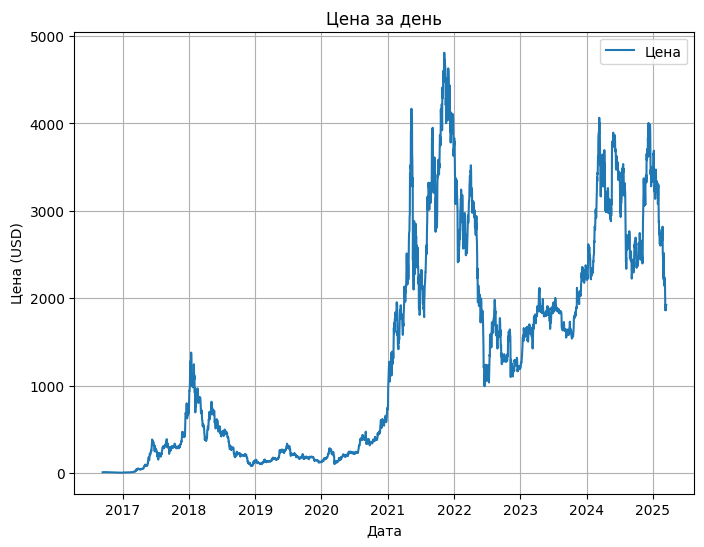

------------------------------------------------------------------------------------------------------------------------------------------------------


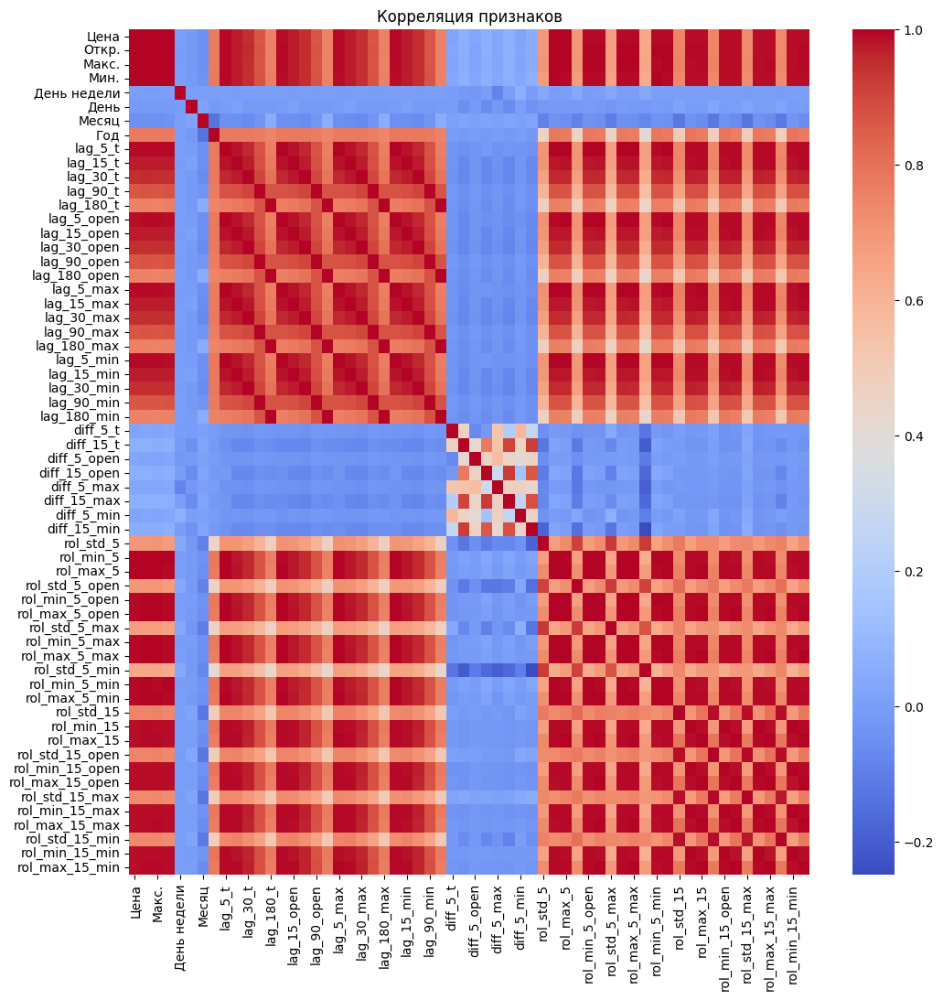

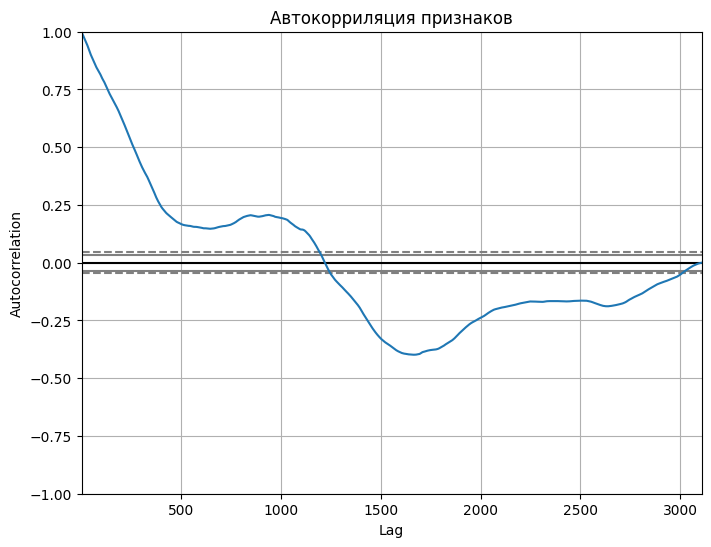

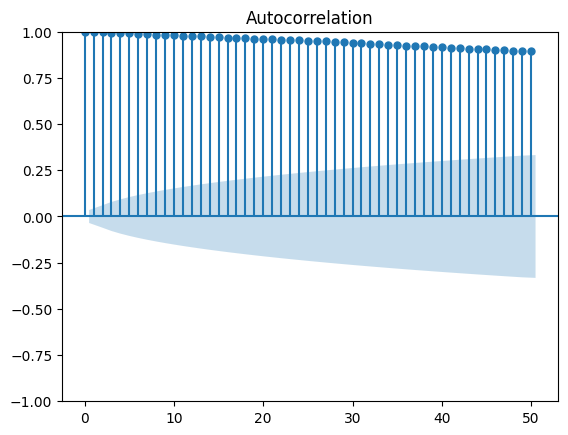

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


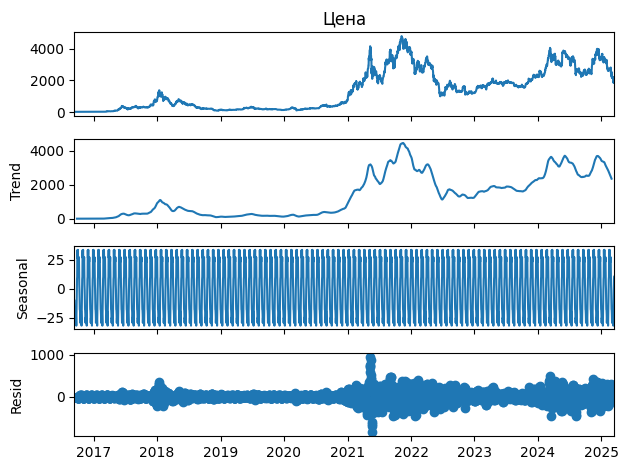

Сезонная декомпозиция ряда, период - 90 дней


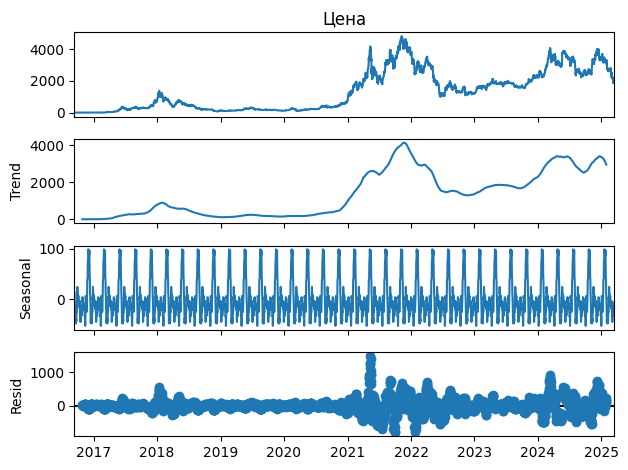

------------------------------------------------------------------------------------------------------------------------------------------------------


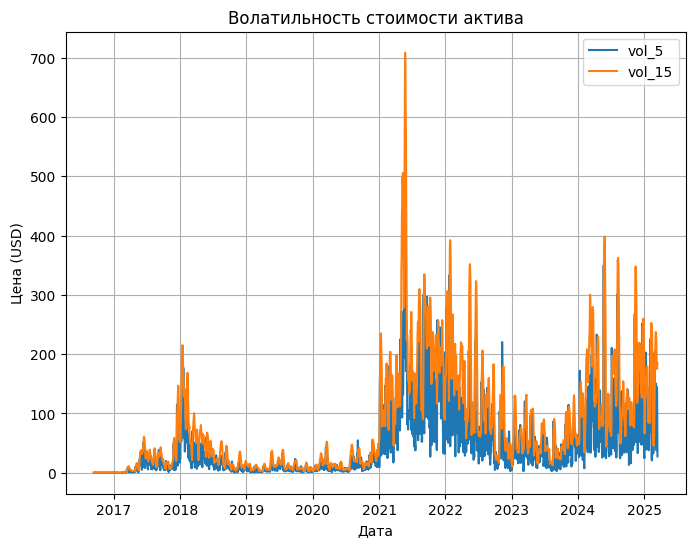

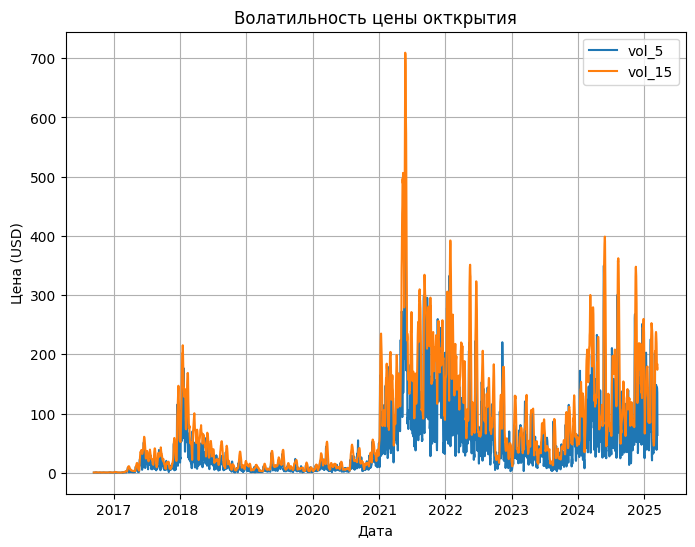

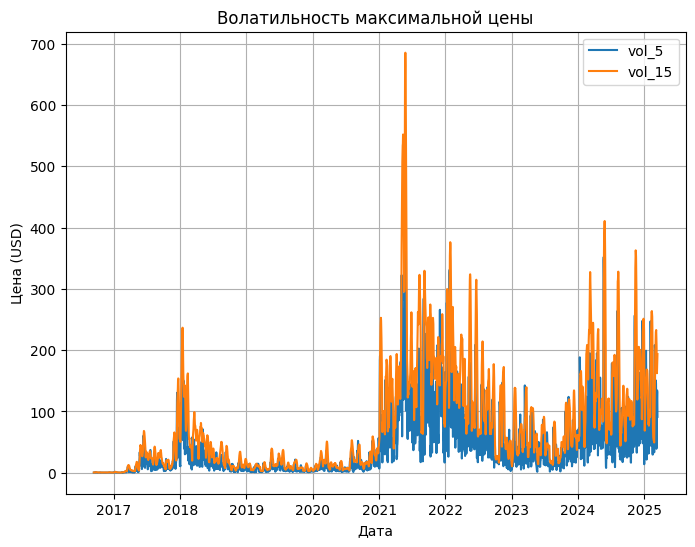

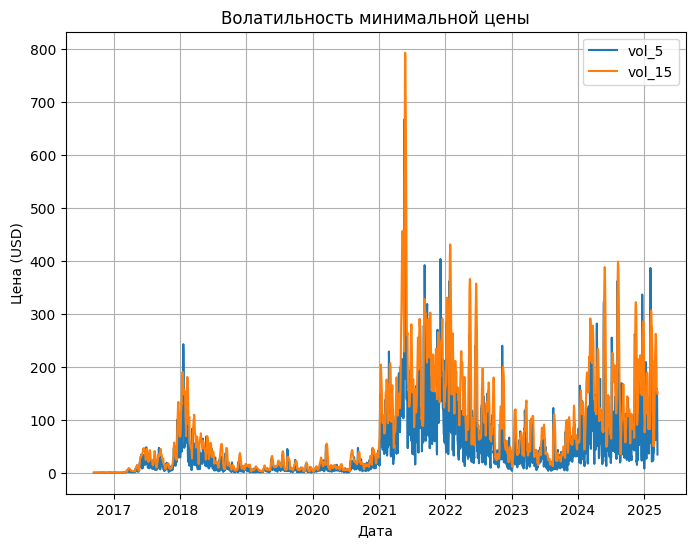

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
0
Обнаружены IQR выбросы:
0
------------------------------------------------------------------------------------------------------------------------------------------------------


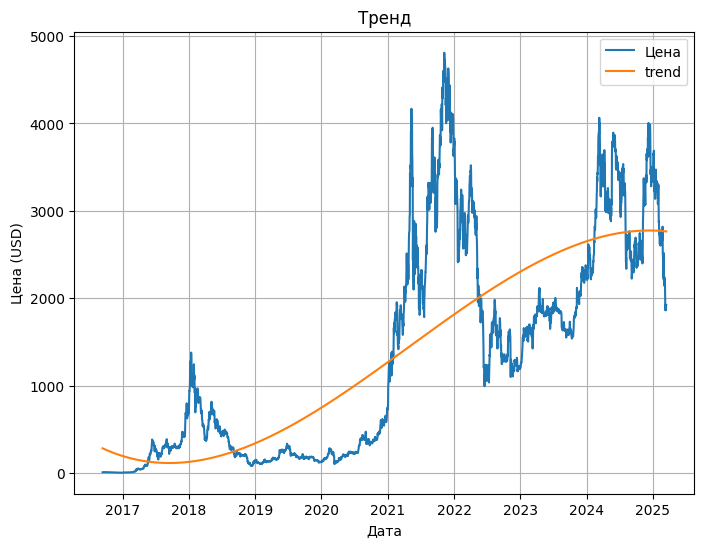

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.29855
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [11]:
crate_base_research_data('crypt_Ethereum', crypt_Ethereum) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                              Обзор датасета: crypt_BTC                                                               
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
                Цена          Откр.          Макс.           Мин.  \
count    3175.000000    3175.000000    3175.000000    3175.000000   
mean    25342.288409   25316.530331   25886.458898   24720.343780   
std     24602.910654   24584.387374   25088.903418   24052.860445   
min       564.600000     564.600000     574.000000     563.000000   
25%      6690.350000    6686.950000    6806.850000    6533.150000   
50%     16345.000000   16310.000000   16660.000000   15829.000000   
75%     40139.500000   40108.000000   41280

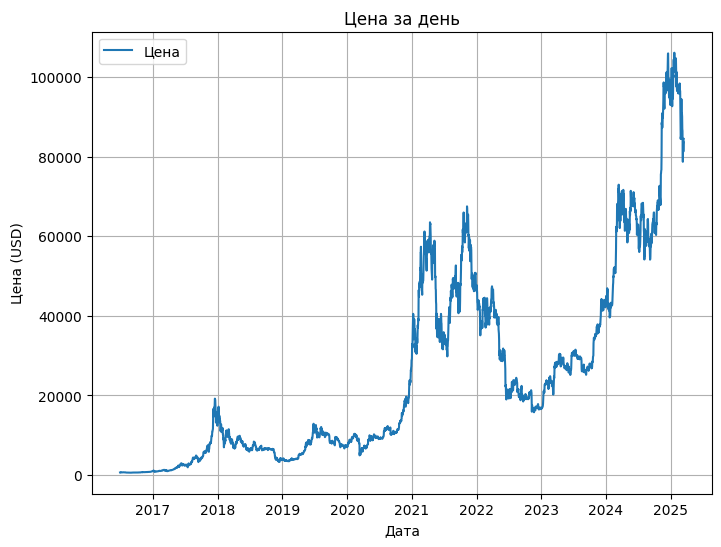

------------------------------------------------------------------------------------------------------------------------------------------------------


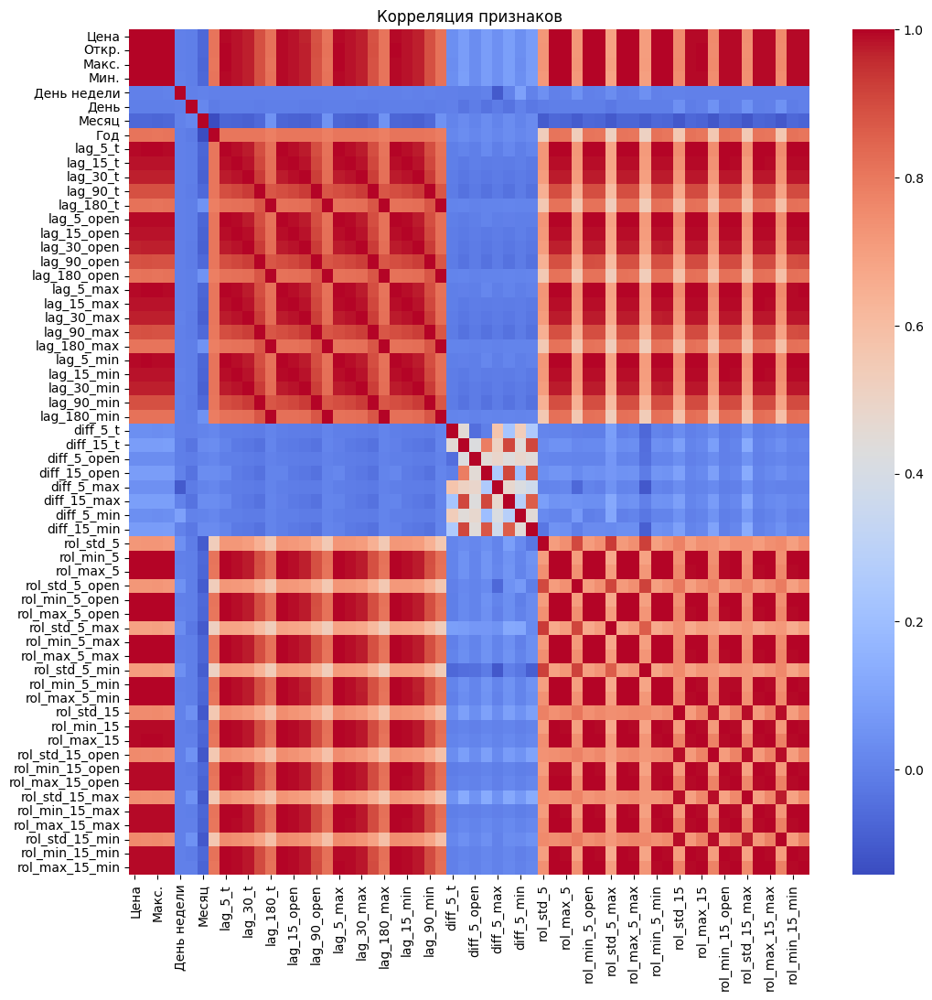

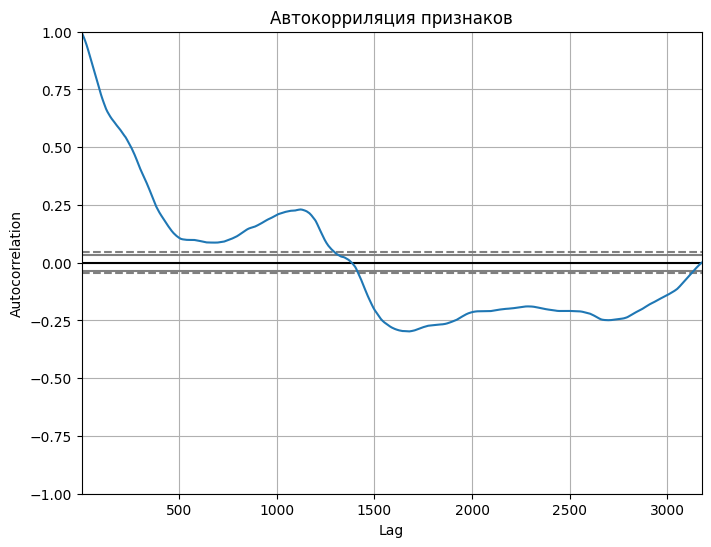

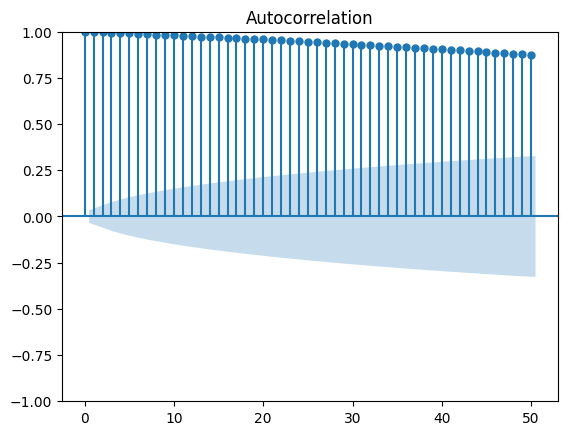

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


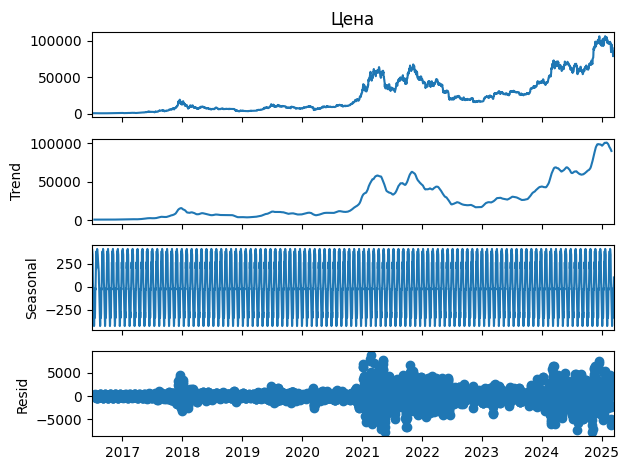

Сезонная декомпозиция ряда, период - 90 дней


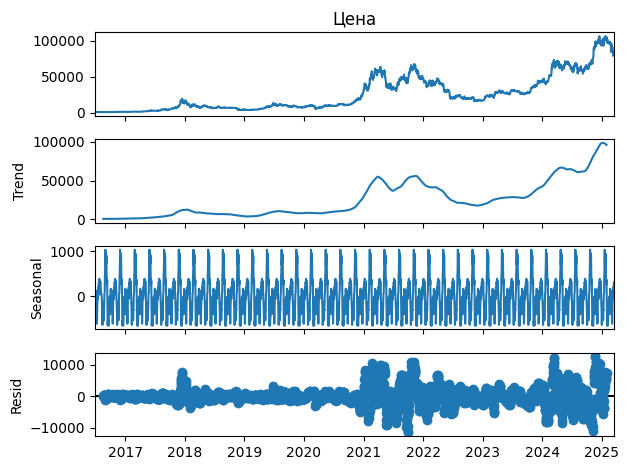

------------------------------------------------------------------------------------------------------------------------------------------------------


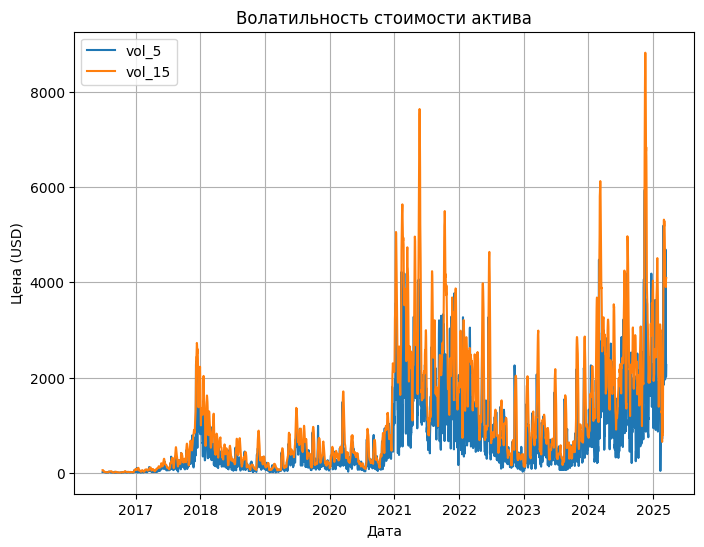

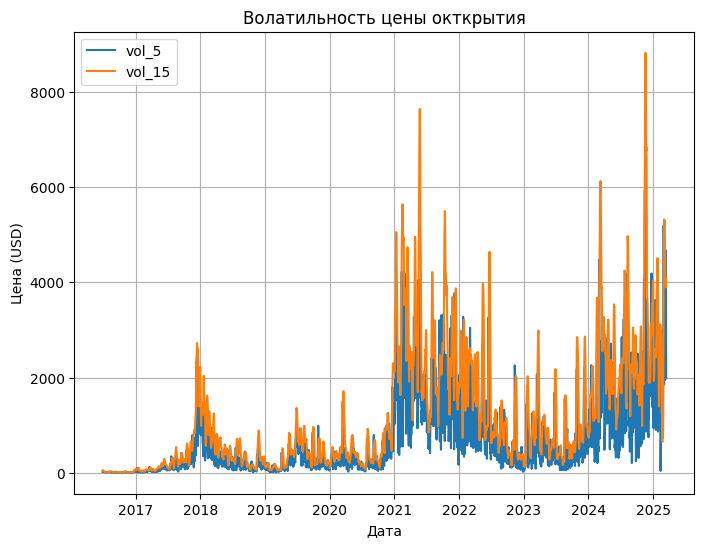

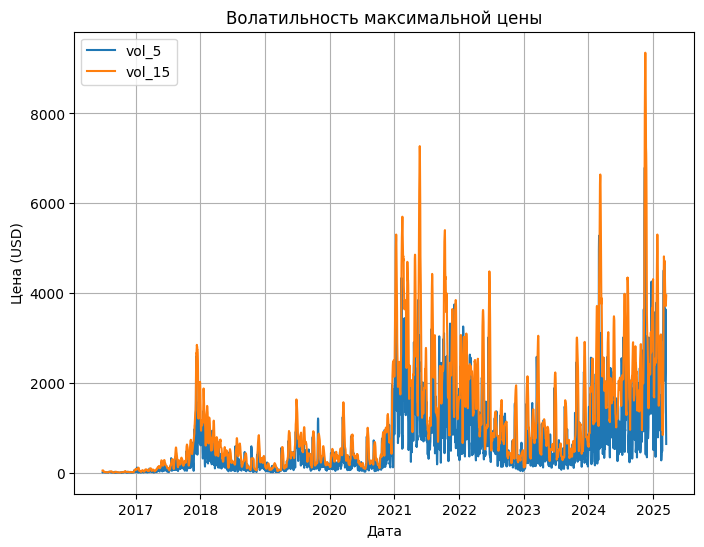

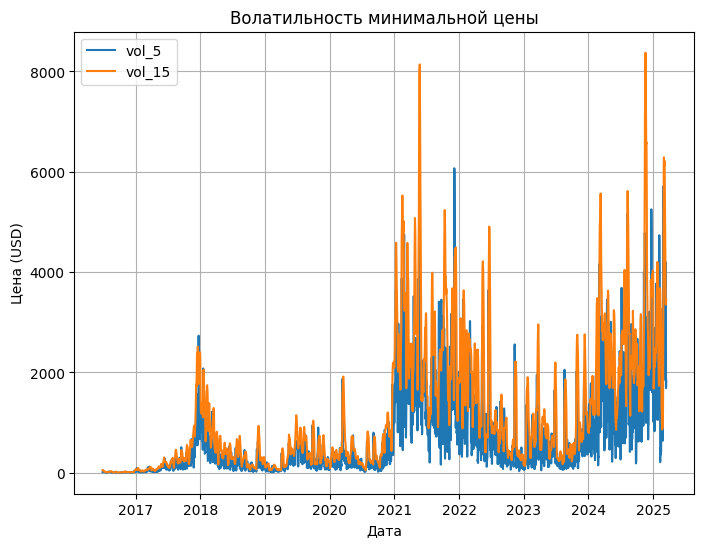

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
32
Обнаружены IQR выбросы:
104
------------------------------------------------------------------------------------------------------------------------------------------------------


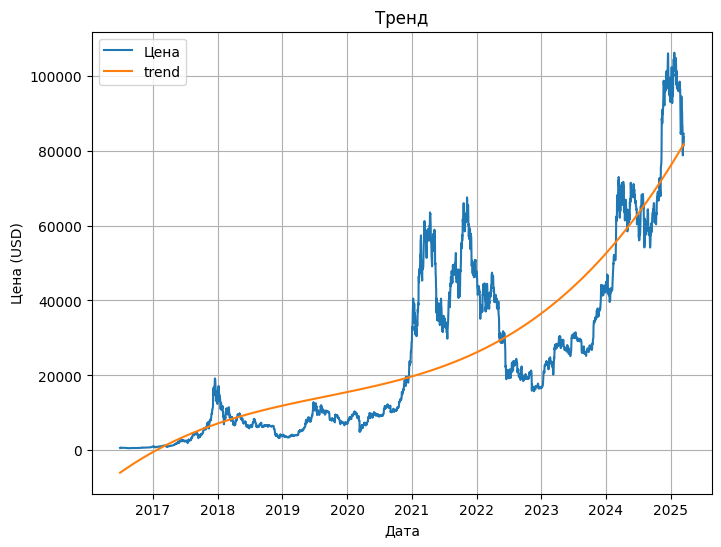

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.84880
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [12]:
crate_base_research_data('crypt_BTC', crypt_BTC) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                           Обзор датасета: futures_WTI_CLJ5                                                           
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  2241.000000  2241.000000  2241.000000  2241.000000  2241.000000   
mean     65.328987    65.336582    66.359054    64.256073     2.051316   
std      16.945395    16.943426    17.234271    16.626483     1.481297   
min      11.570000    18.010000    19.660000     6.500000     0.000000   
25%      52.810000    52.780000    53.500000    52.150000     1.000000   
50%      66.100000    66.030000    67.090000    65.090000     2.000000   
75%     

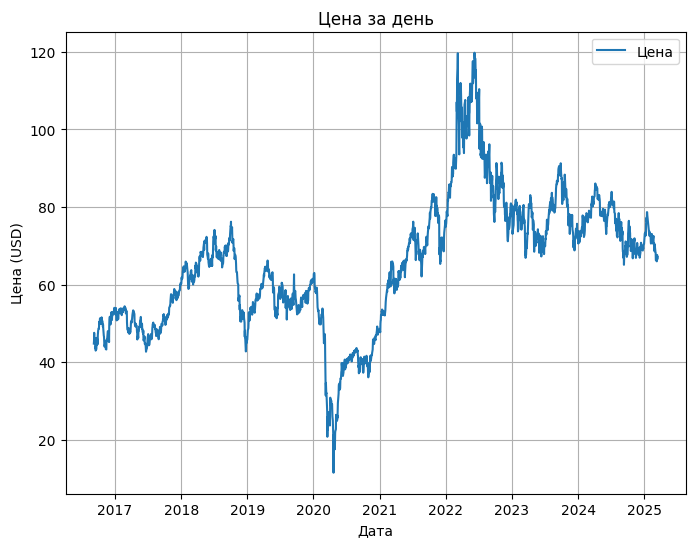

------------------------------------------------------------------------------------------------------------------------------------------------------


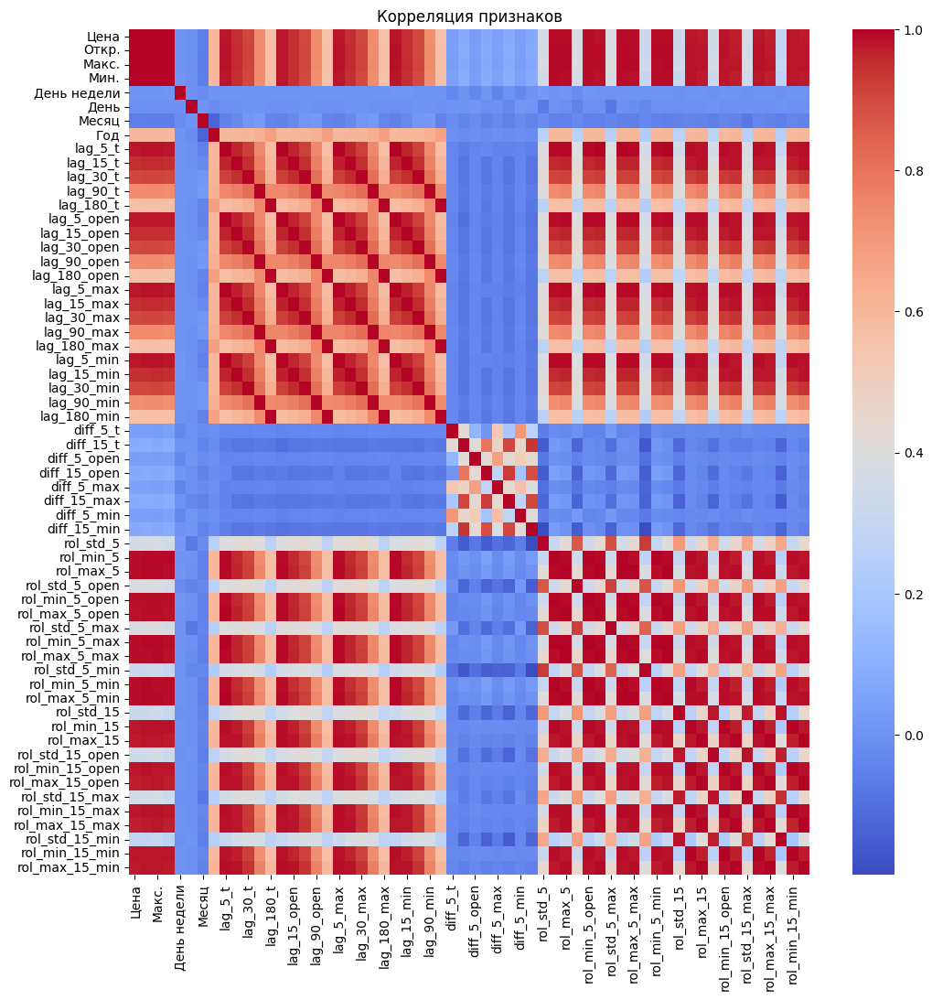

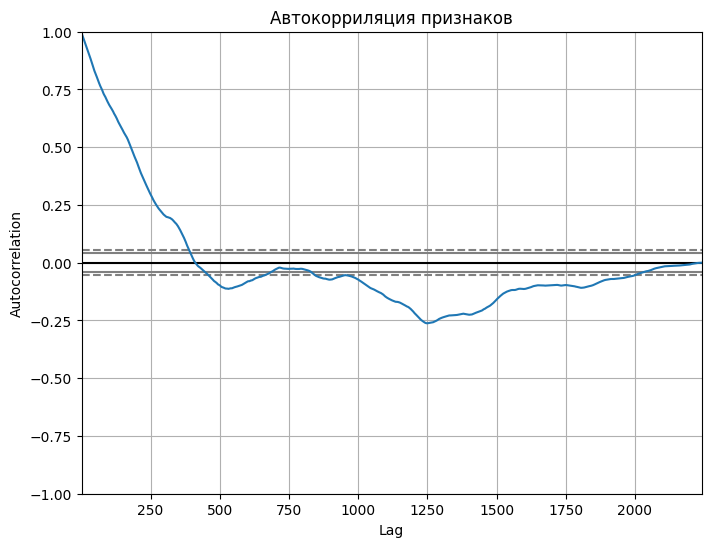

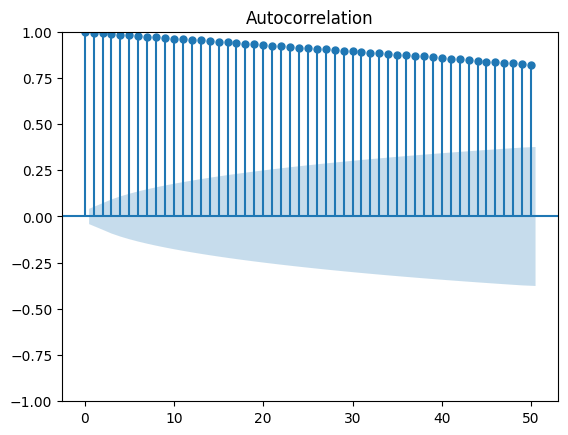

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


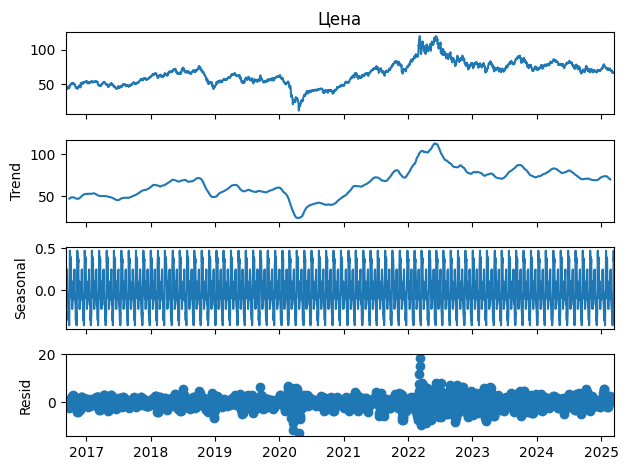

Сезонная декомпозиция ряда, период - 90 дней


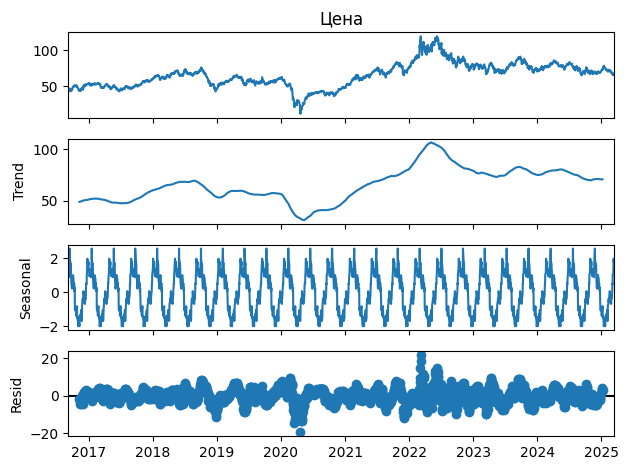

------------------------------------------------------------------------------------------------------------------------------------------------------


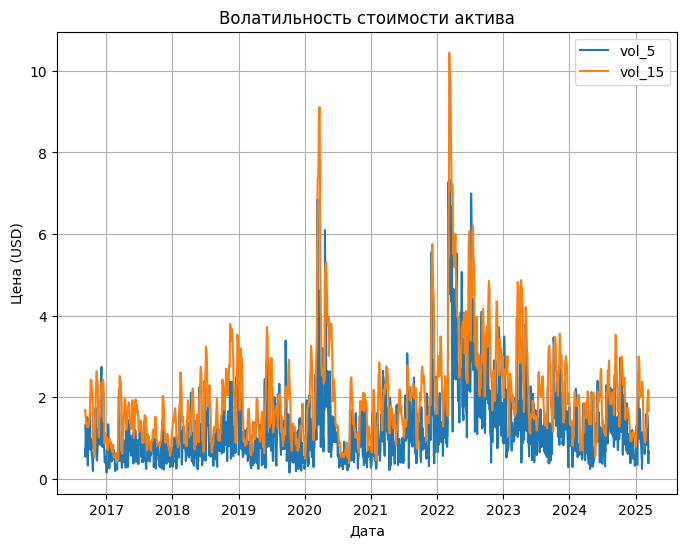

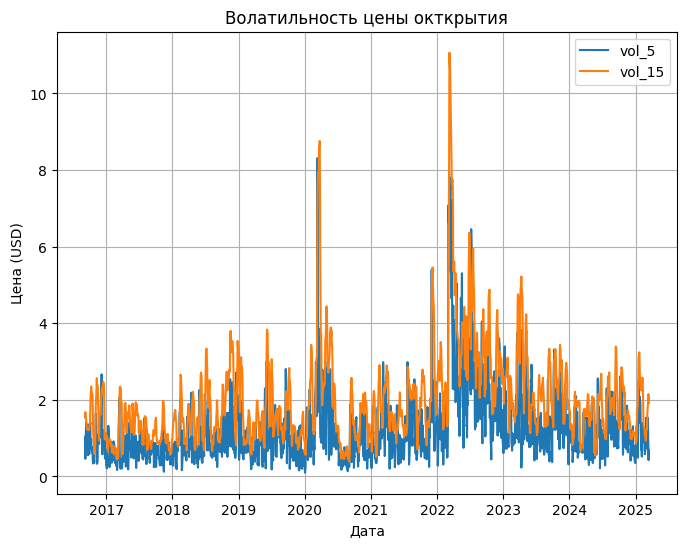

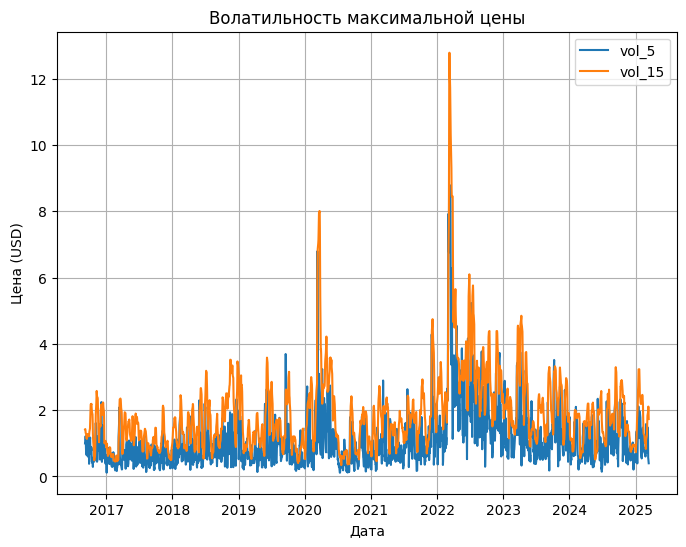

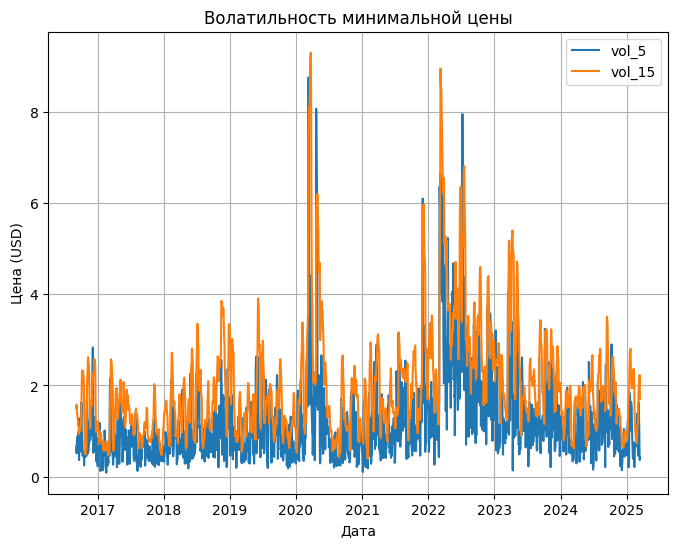

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
10
Обнаружены IQR выбросы:
22
------------------------------------------------------------------------------------------------------------------------------------------------------


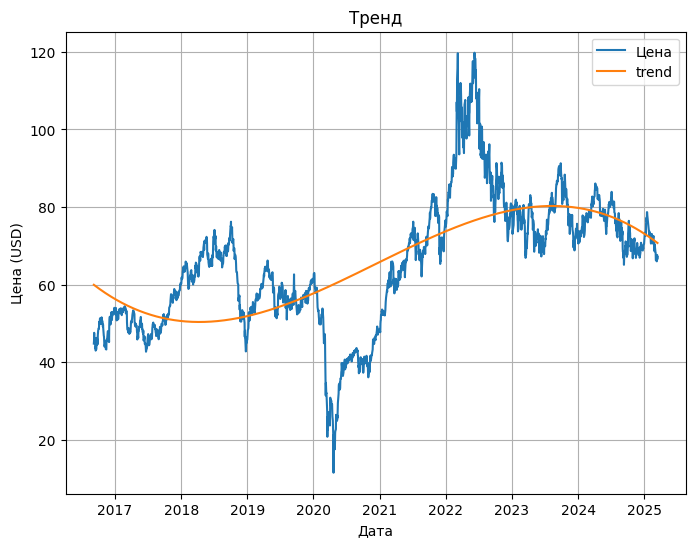

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.28043
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [13]:
crate_base_research_data('futures_WTI_CLJ5', futures_WTI_CLJ5)

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                         Обзор датасета: futures_Brent_LCOK5                                                          
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  2196.000000  2196.000000  2196.000000  2196.000000  2196.000000   
mean     70.098834    70.095879    71.140378    69.006603     1.999089   
std      17.691122    17.679066    17.992205    17.350496     1.410342   
min      19.330000    19.900000    21.290000    15.980000     0.000000   
25%      57.440000    57.410000    58.307500    56.727500     1.000000   
50%      71.605000    71.635000    72.495000    70.705000     2.000000   
75%     

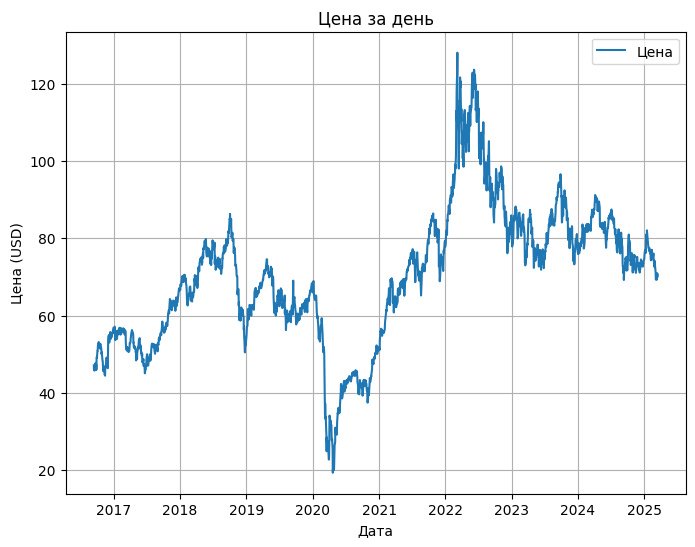

------------------------------------------------------------------------------------------------------------------------------------------------------


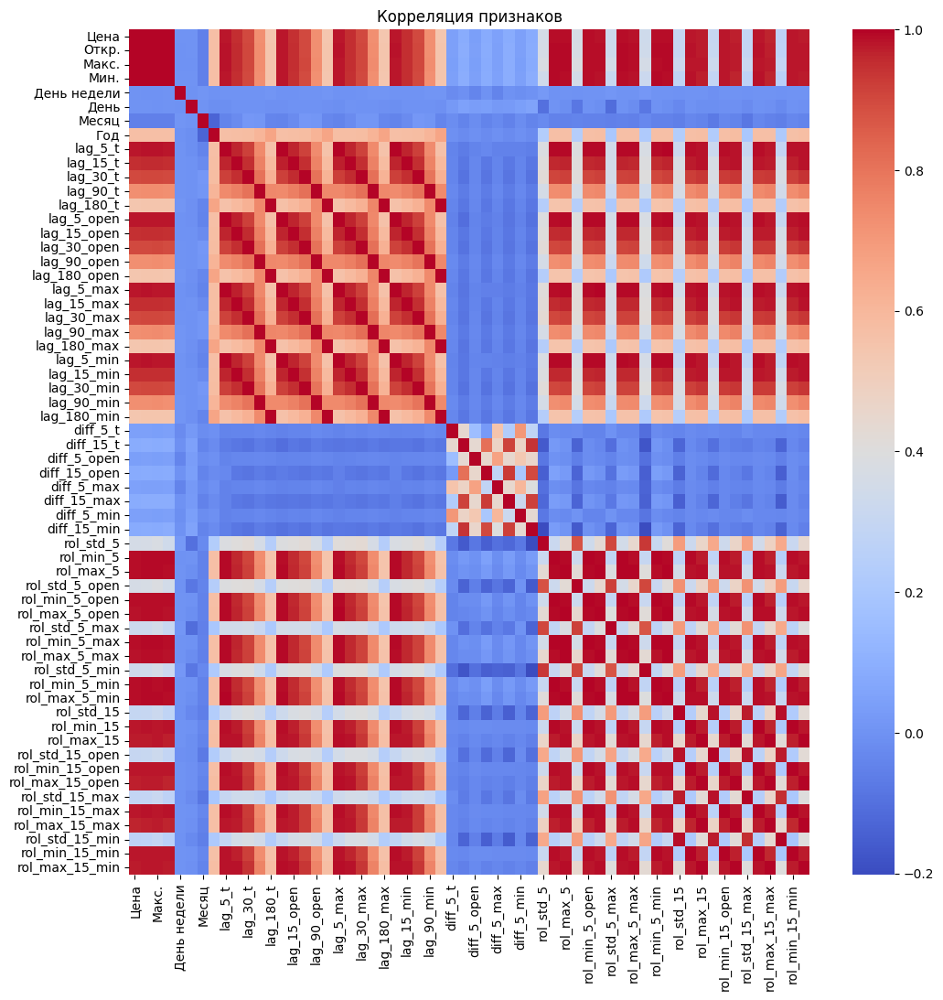

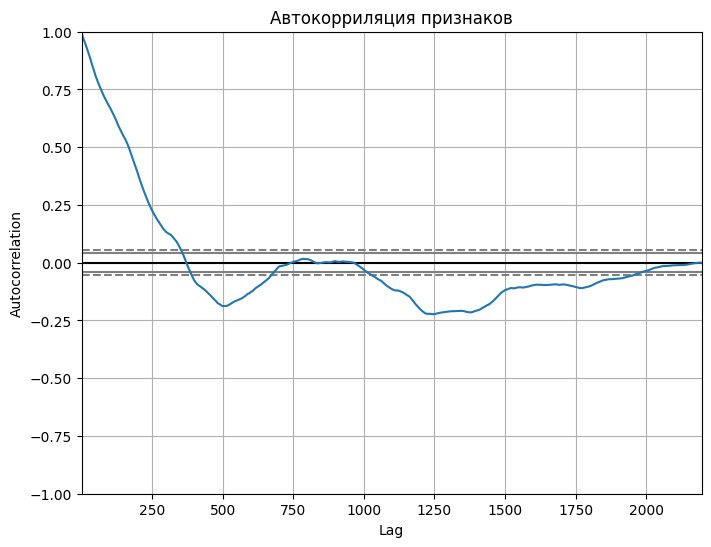

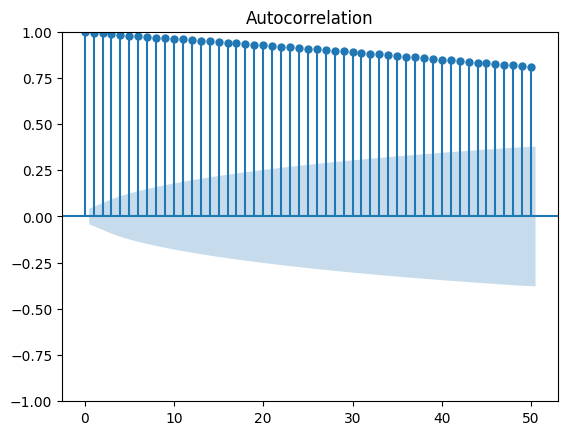

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


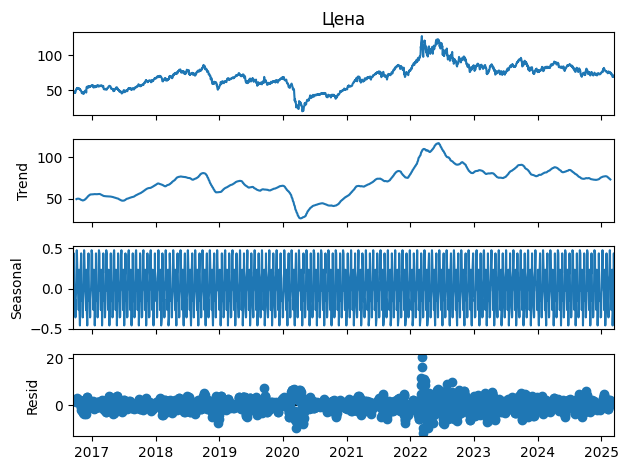

Сезонная декомпозиция ряда, период - 90 дней


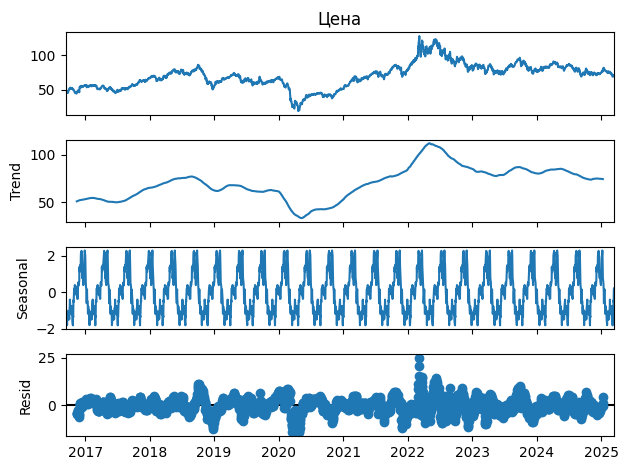

------------------------------------------------------------------------------------------------------------------------------------------------------


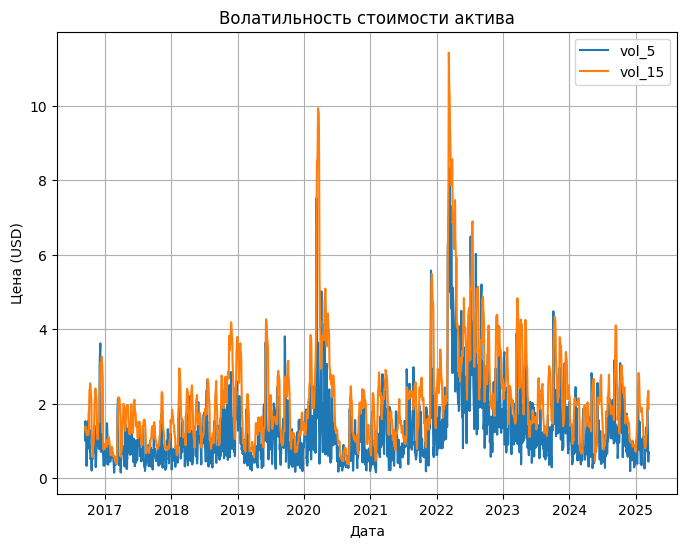

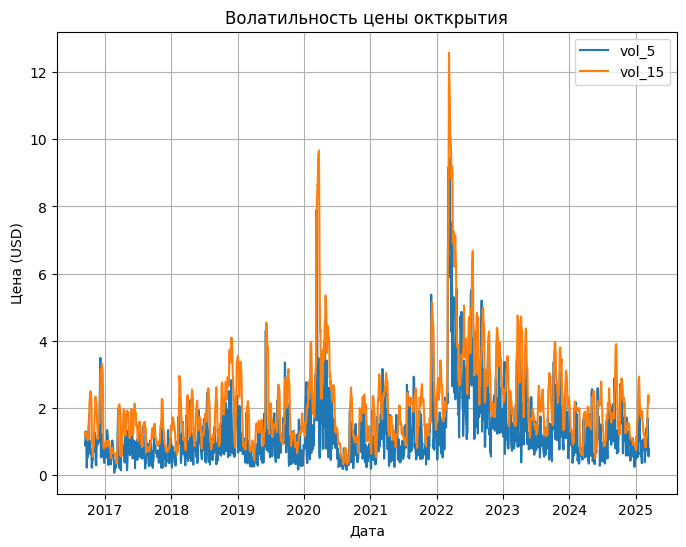

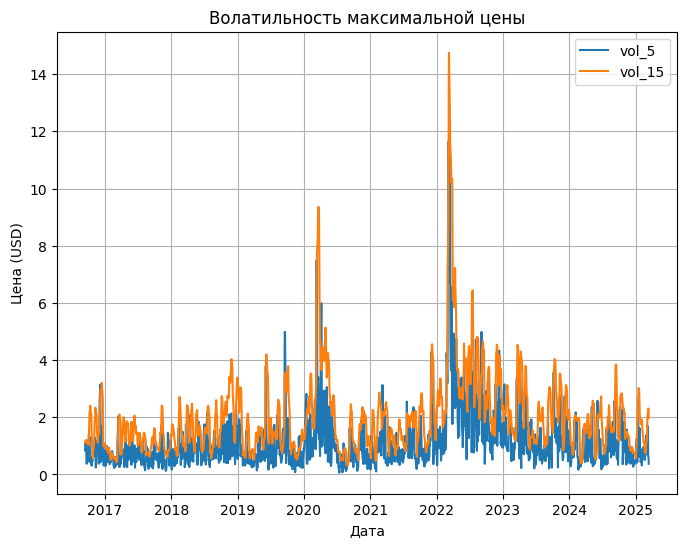

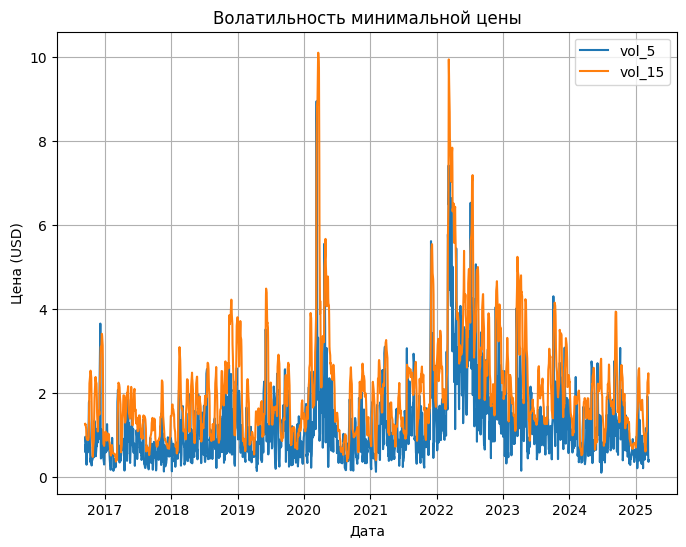

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
3
Обнаружены IQR выбросы:
28
------------------------------------------------------------------------------------------------------------------------------------------------------


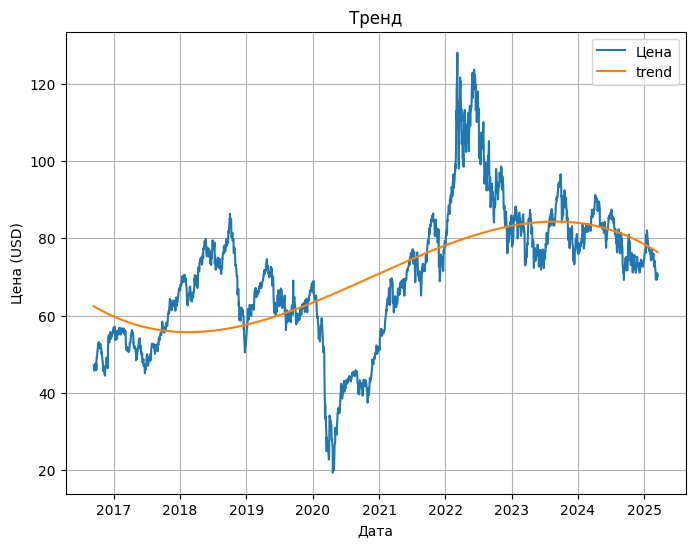

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.24339
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [14]:
crate_base_research_data('futures_Brent_LCOK5', futures_Brent_LCOK5) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                      Обзор датасета: share_metal_jiangxi_copper                                                      
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  2104.000000  2104.000000  2104.000000  2104.000000  2104.000000   
mean     10.507972    10.522824    10.680970    10.339129     2.020437   
std       2.471551     2.478813     2.545128     2.400636     1.404111   
min       5.434719     5.528568     5.682139     5.409123     0.000000   
25%       8.468569     8.480500     8.599423     8.336320     1.000000   
50%      10.328661    10.369219    10.508334    10.165138     2.000000   
75%     

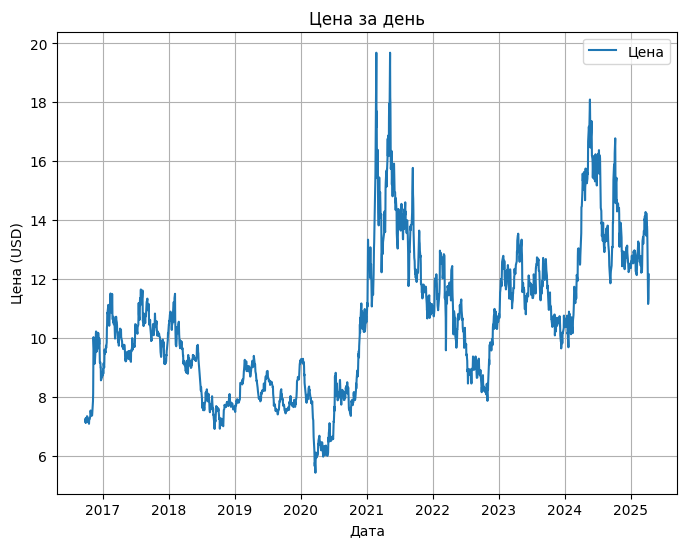

------------------------------------------------------------------------------------------------------------------------------------------------------


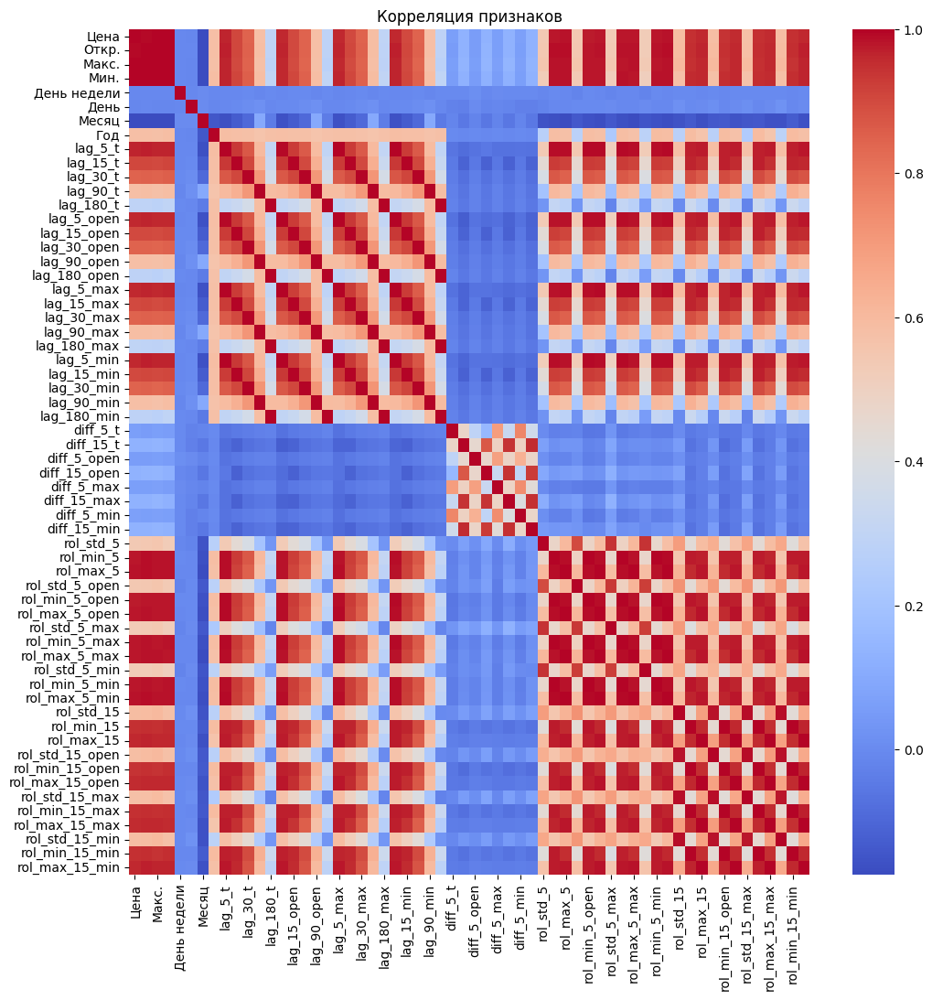

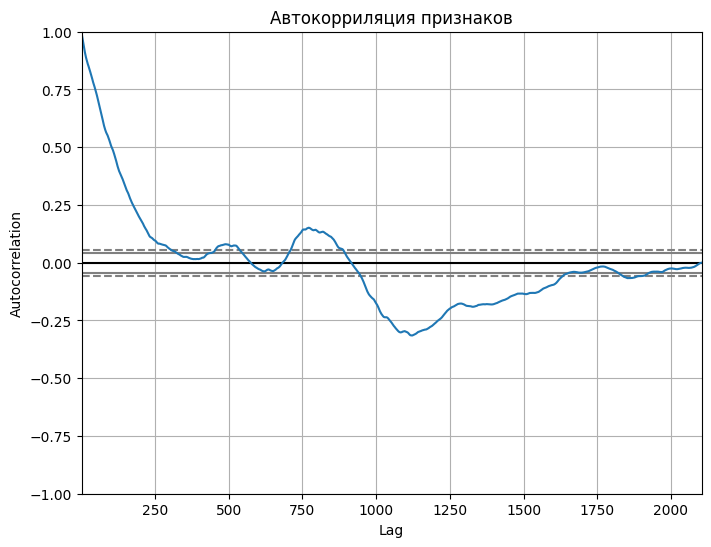

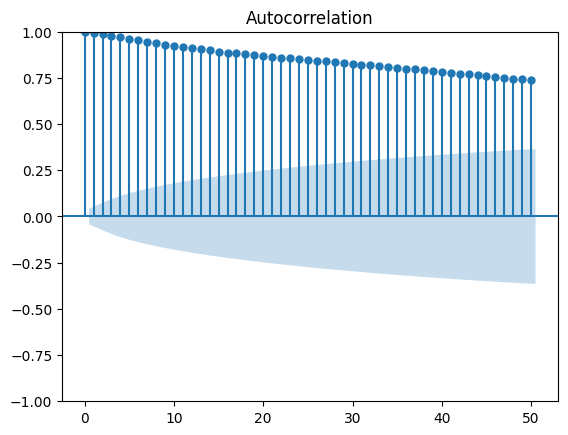

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


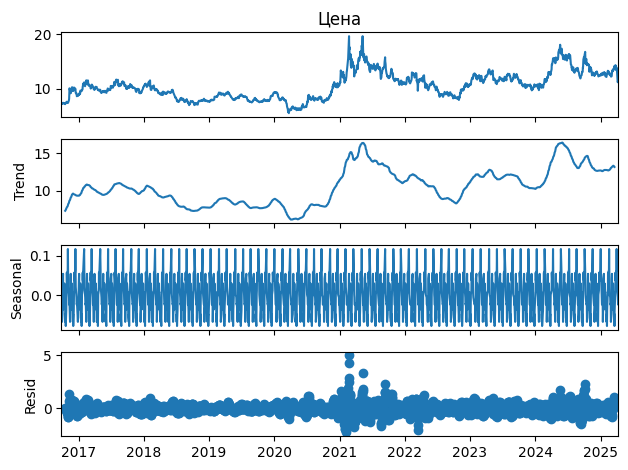

Сезонная декомпозиция ряда, период - 90 дней


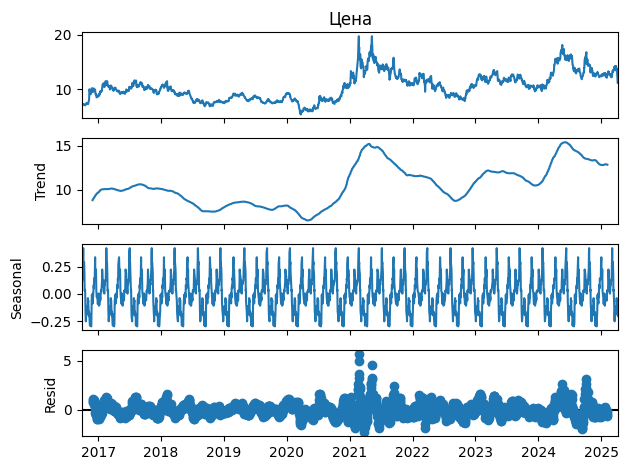

------------------------------------------------------------------------------------------------------------------------------------------------------


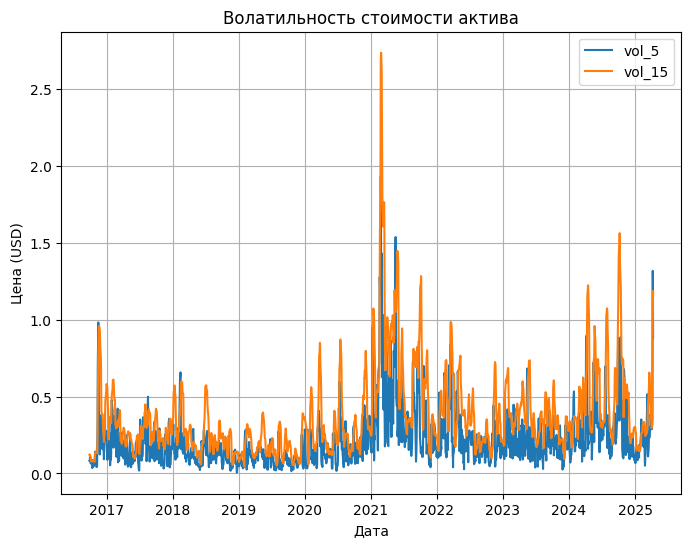

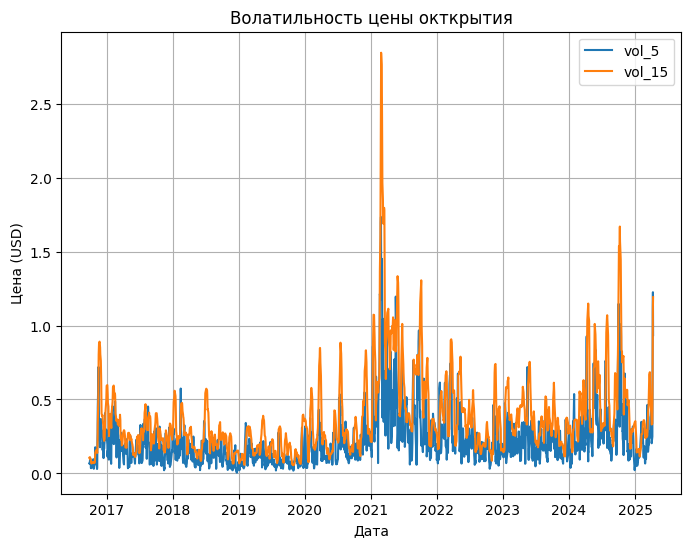

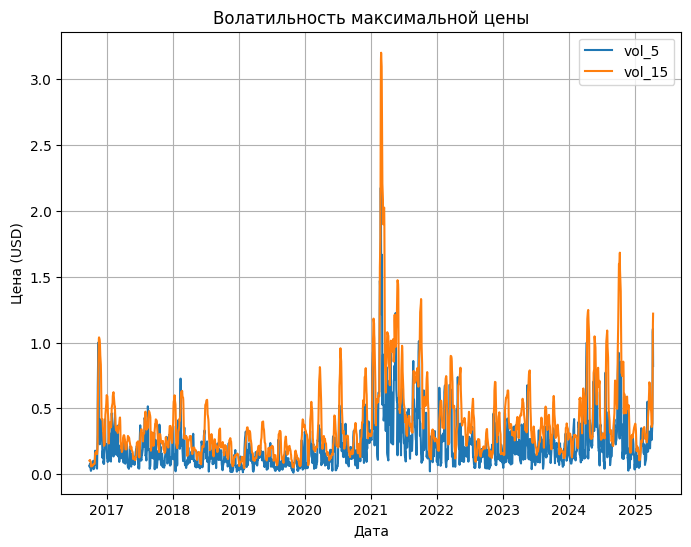

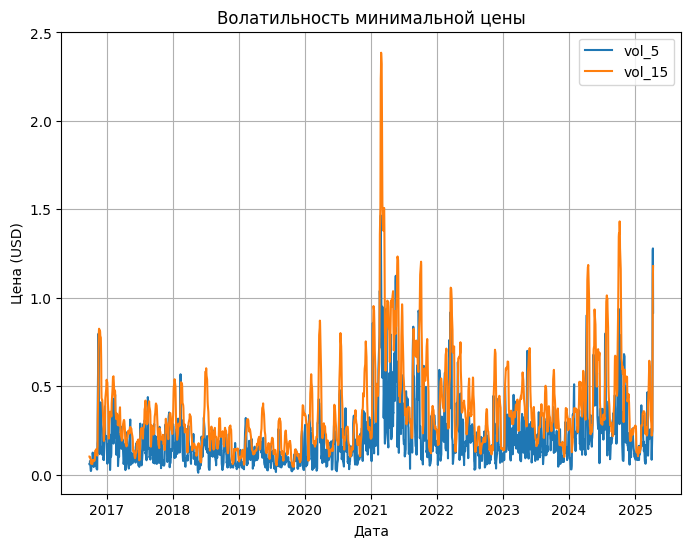

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
7
Обнаружены IQR выбросы:
8
------------------------------------------------------------------------------------------------------------------------------------------------------


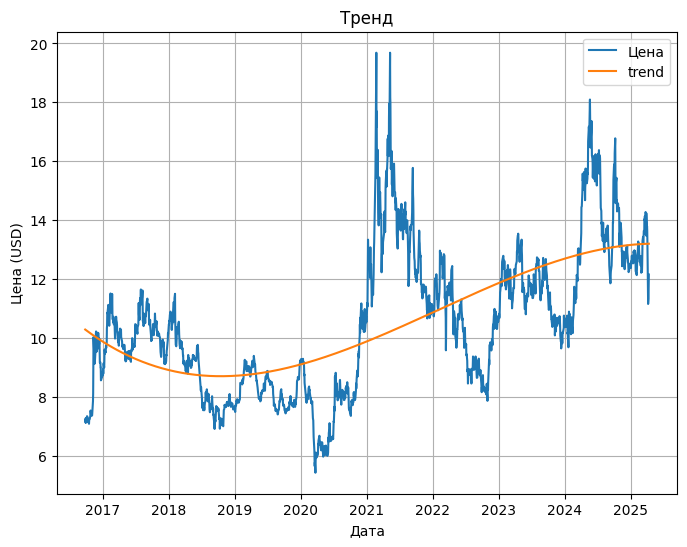

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.04492
 Ряд стационарный (p < 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [15]:
crate_base_research_data('share_metal_jiangxi_copper', share_metal_jiangxi_copper) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                       Обзор датасета: share_metal_baoshan_iron                                                       
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  1980.000000  1980.000000  1980.000000  1980.000000  1980.000000   
mean      5.414495     5.411361     5.487761     5.338296     2.011616   
std       0.997624     0.996165     1.024834     0.969643     1.407181   
min       3.392548     3.436799     3.466299     3.377798     0.000000   
25%       4.675816     4.680842     4.730034     4.625341     1.000000   
50%       5.447467     5.452579     5.513819     5.372752     2.000000   
75%     

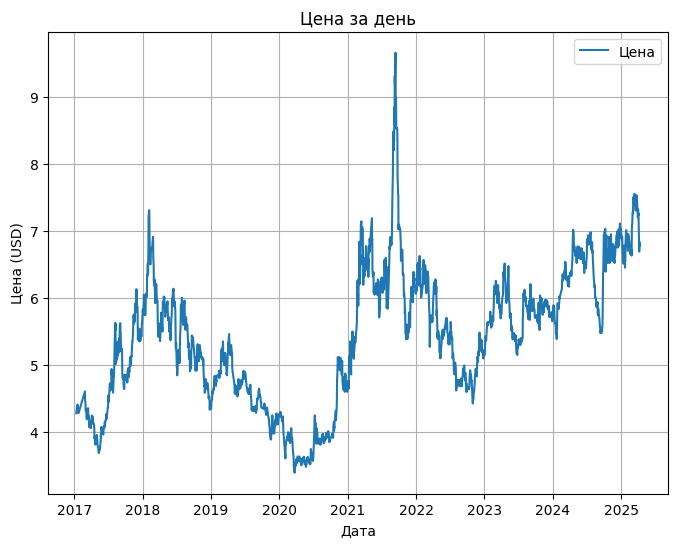

------------------------------------------------------------------------------------------------------------------------------------------------------


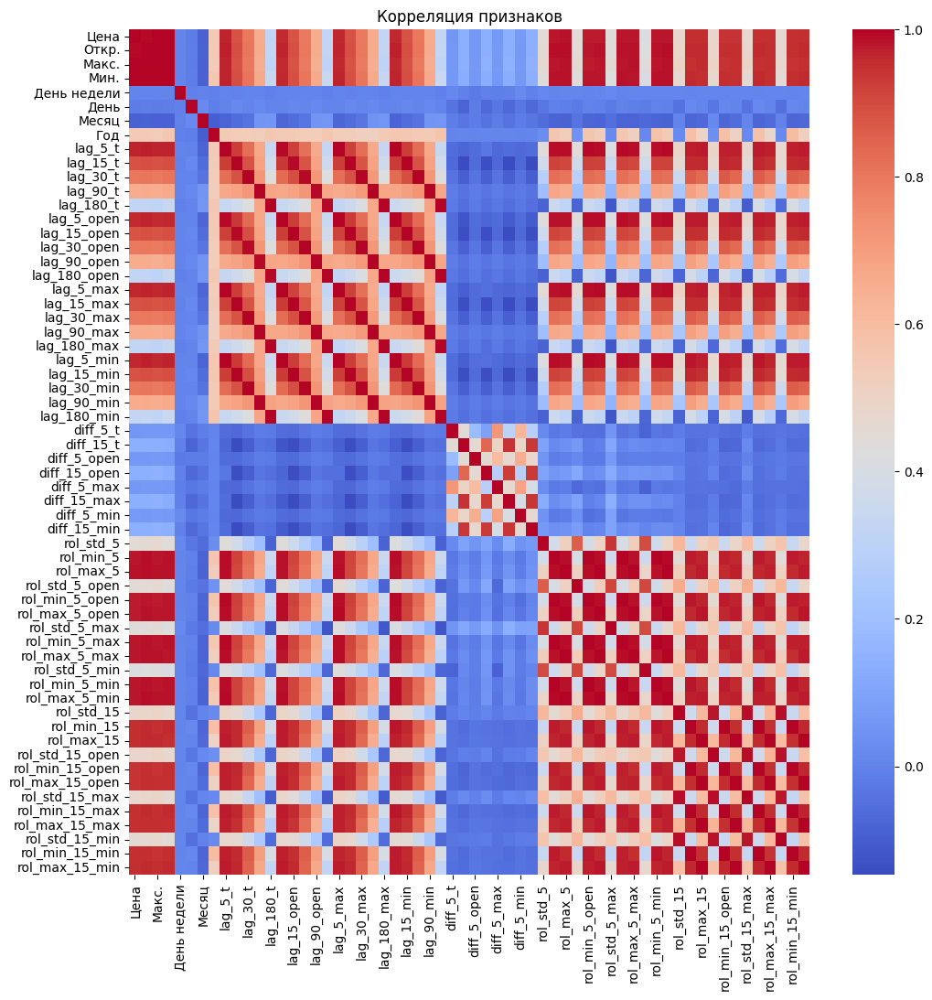

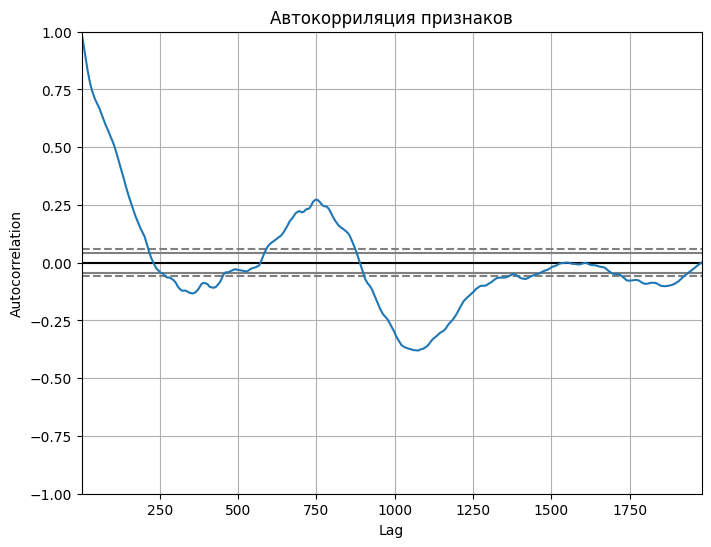

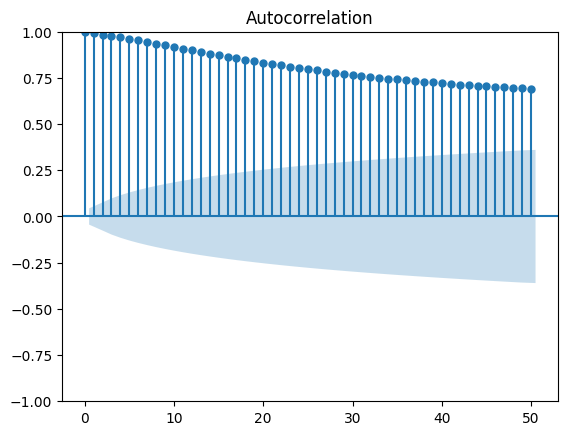

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


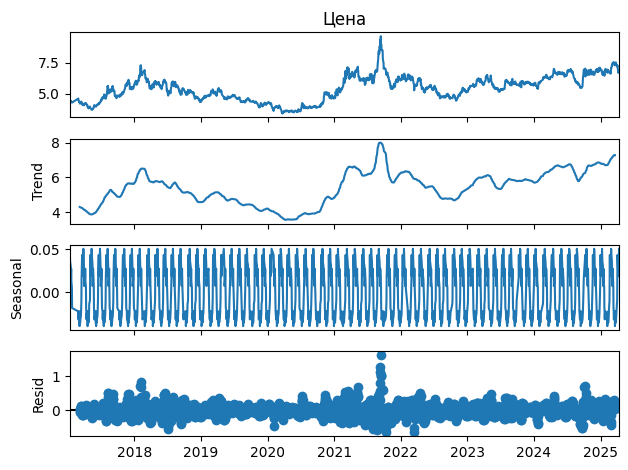

Сезонная декомпозиция ряда, период - 90 дней


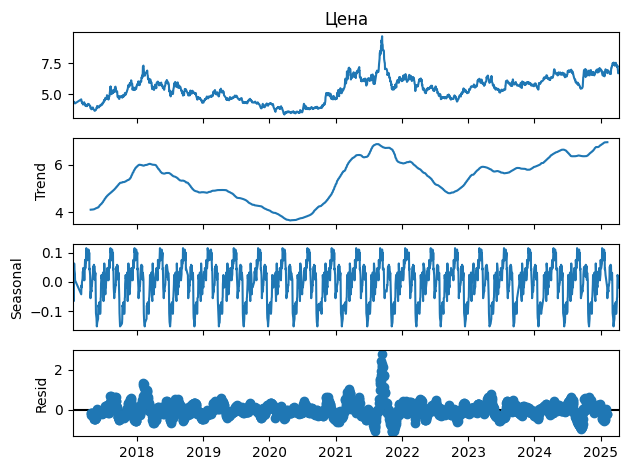

------------------------------------------------------------------------------------------------------------------------------------------------------


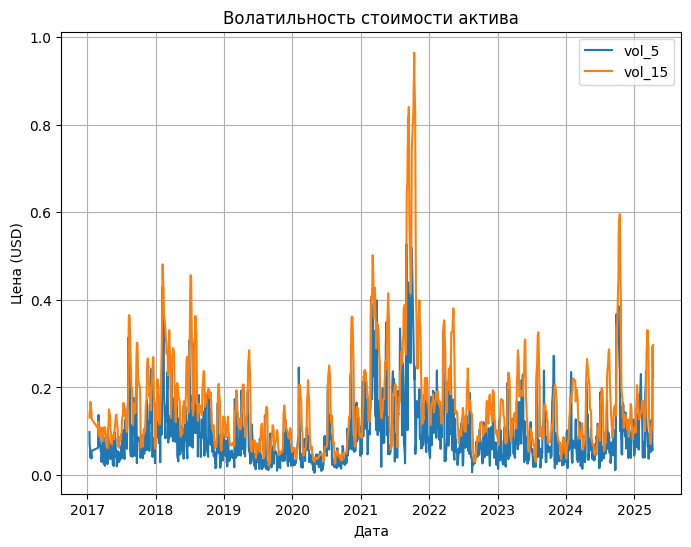

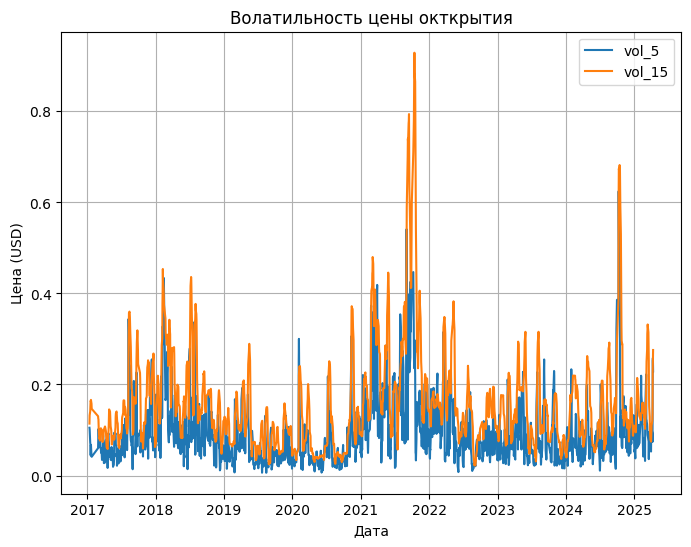

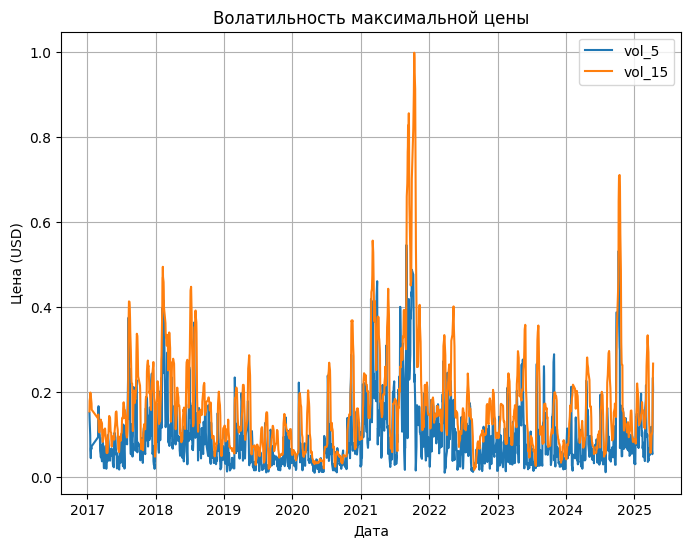

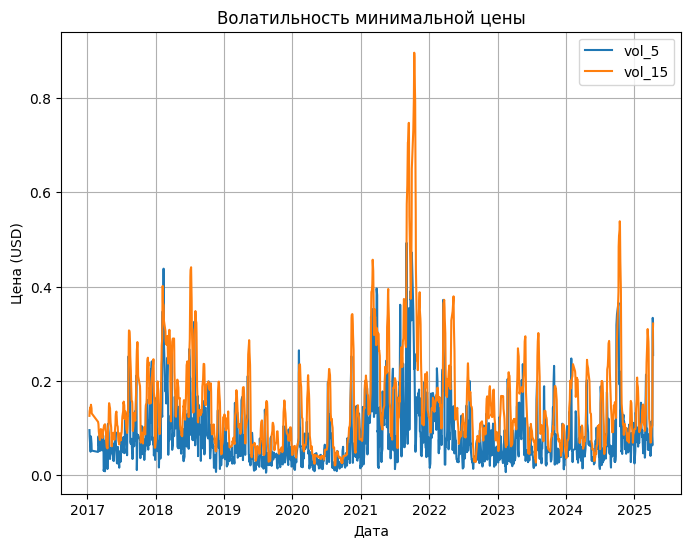

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
12
Обнаружены IQR выбросы:
15
------------------------------------------------------------------------------------------------------------------------------------------------------


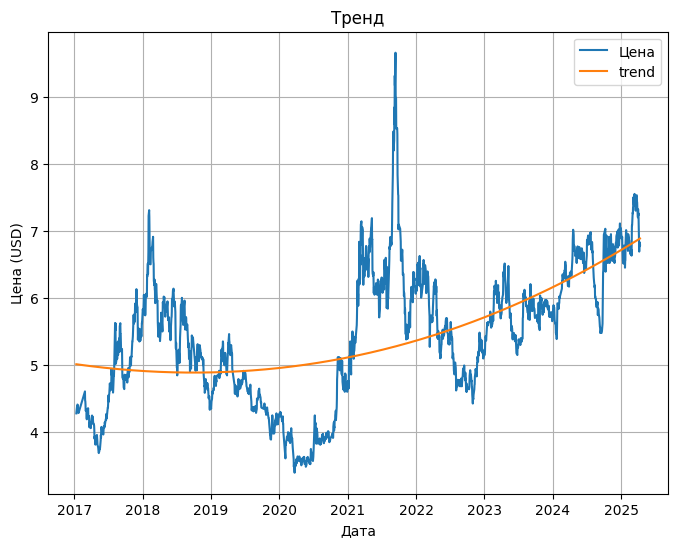

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.10070
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [16]:
crate_base_research_data('share_metal_baoshan_iron', share_metal_baoshan_iron) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                       Обзор датасета: share_oil_petrochina_hk                                                        
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  2102.000000  2102.000000  2102.000000  2102.000000  2102.000000   
mean      3.641803     3.642271     3.688409     3.596389     2.019505   
std       1.370446     1.368893     1.391899     1.350871     1.404114   
min       1.525472     1.552835     1.573357     1.504950     0.000000   
25%       2.743113     2.750029     2.781103     2.710453     1.000000   
50%       3.394980     3.395895     3.429785     3.368461     2.000000   
75%     

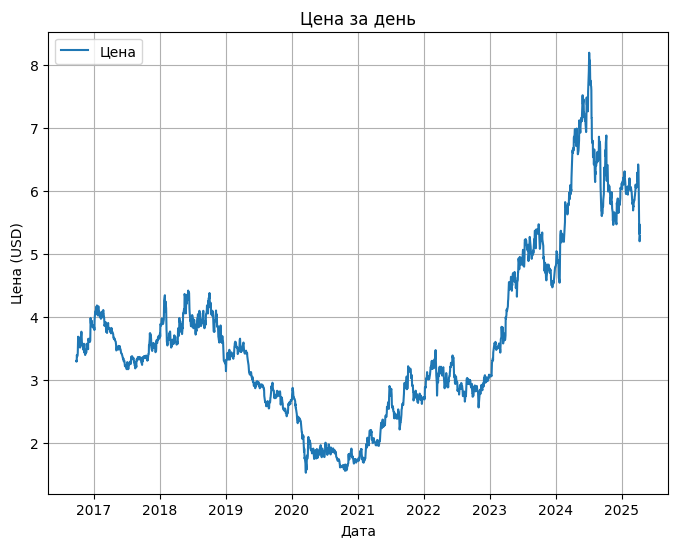

------------------------------------------------------------------------------------------------------------------------------------------------------


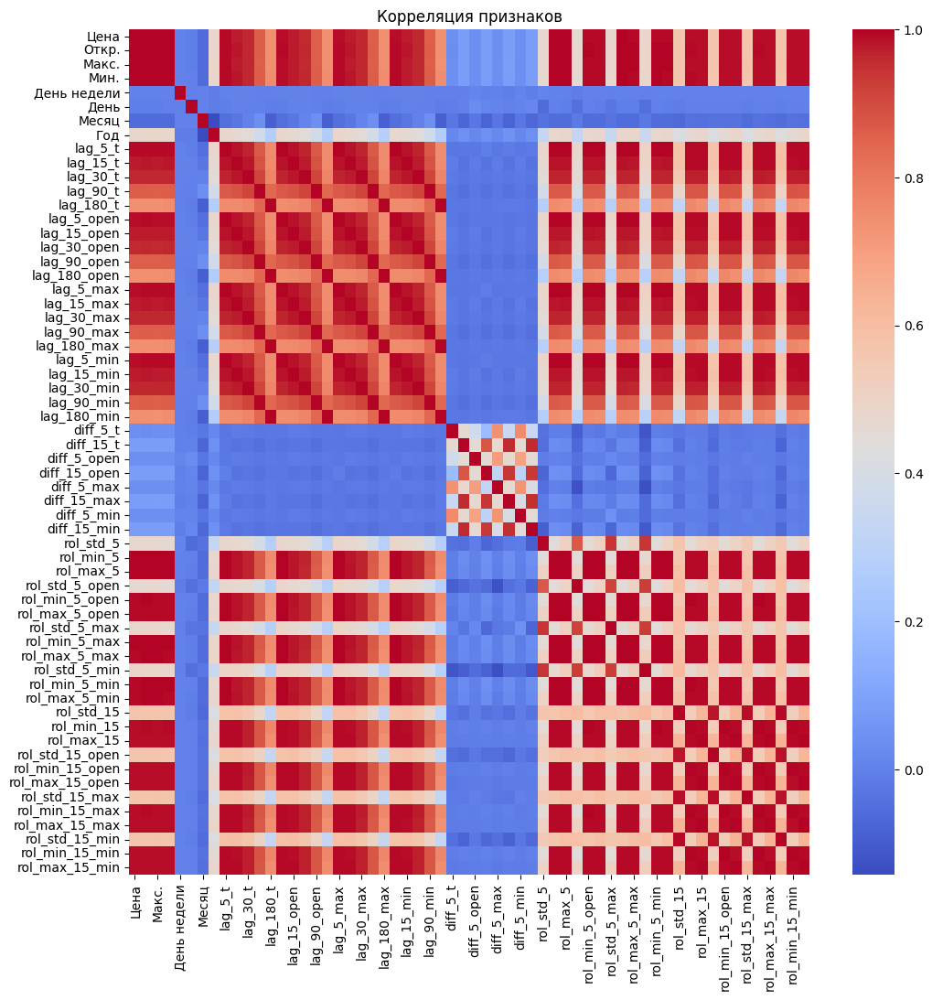

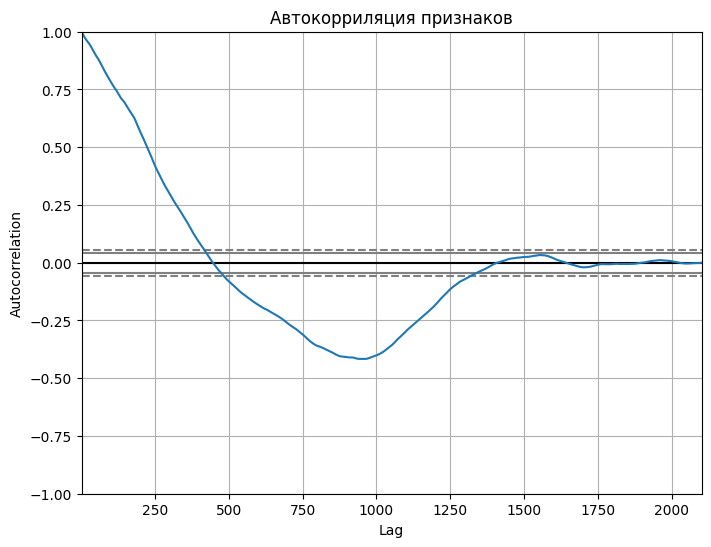

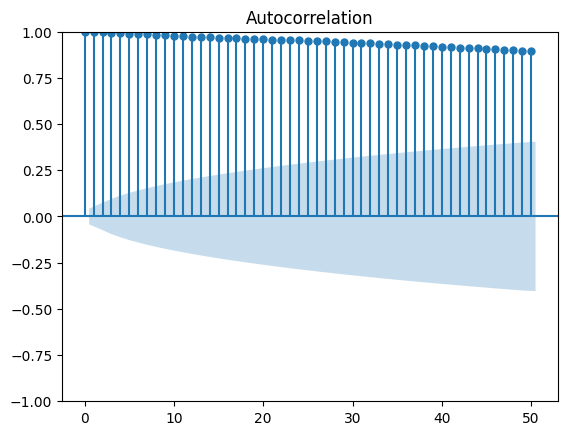

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


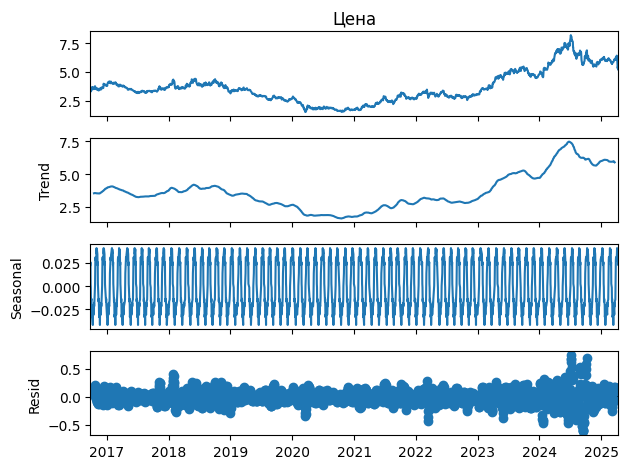

Сезонная декомпозиция ряда, период - 90 дней


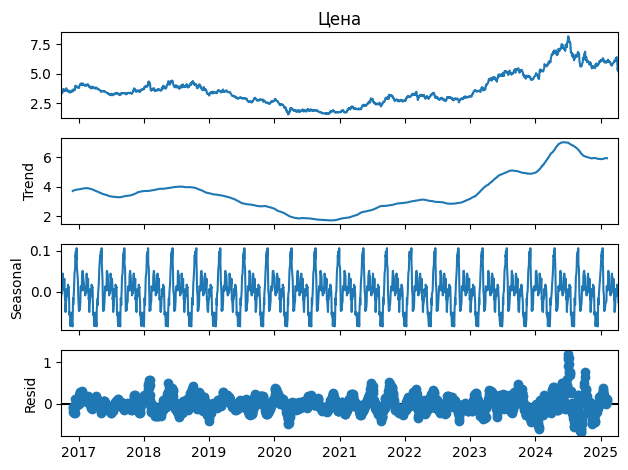

------------------------------------------------------------------------------------------------------------------------------------------------------


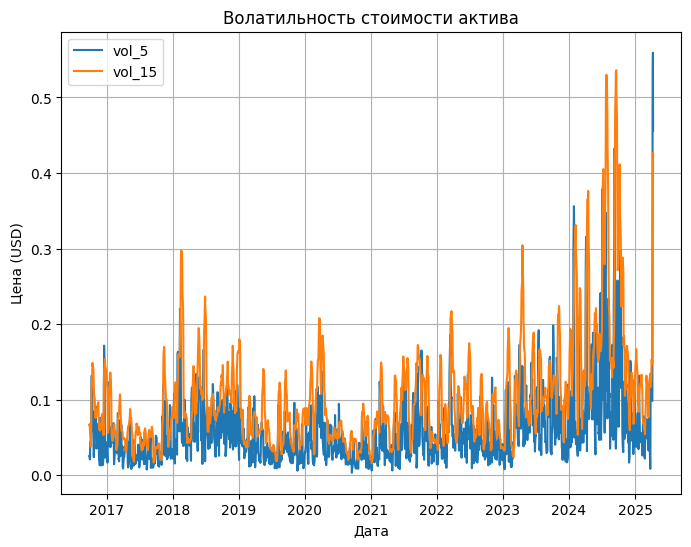

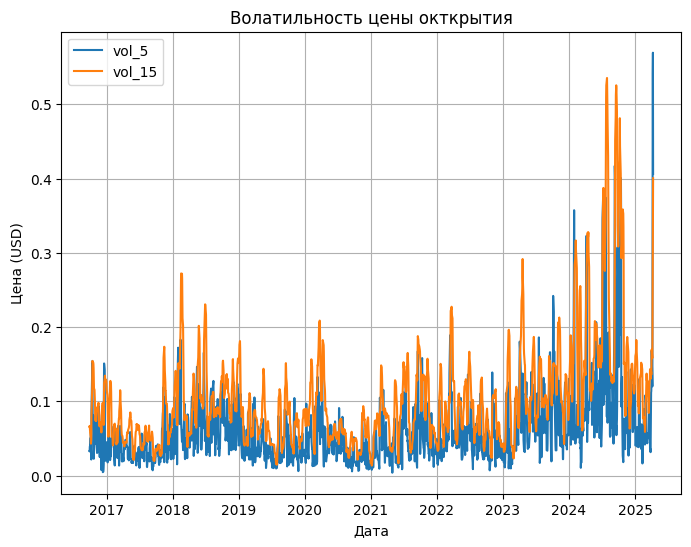

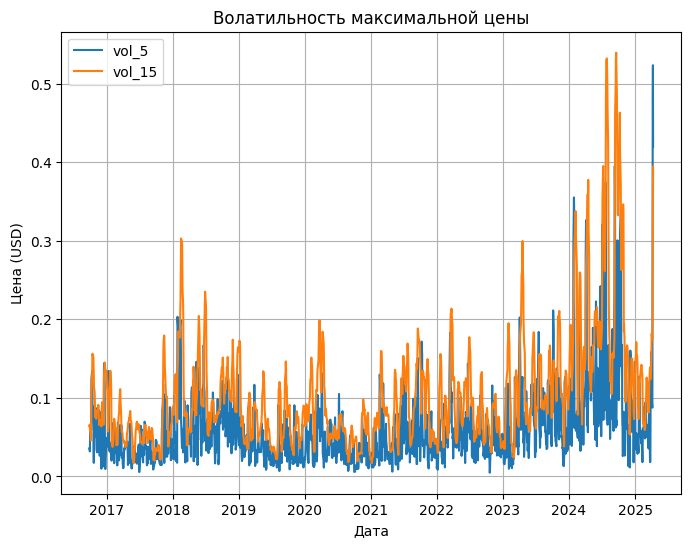

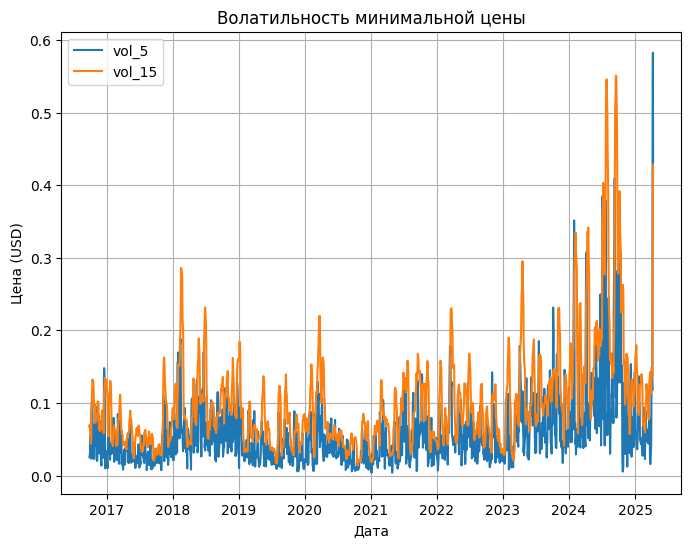

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
7
Обнаружены IQR выбросы:
114
------------------------------------------------------------------------------------------------------------------------------------------------------


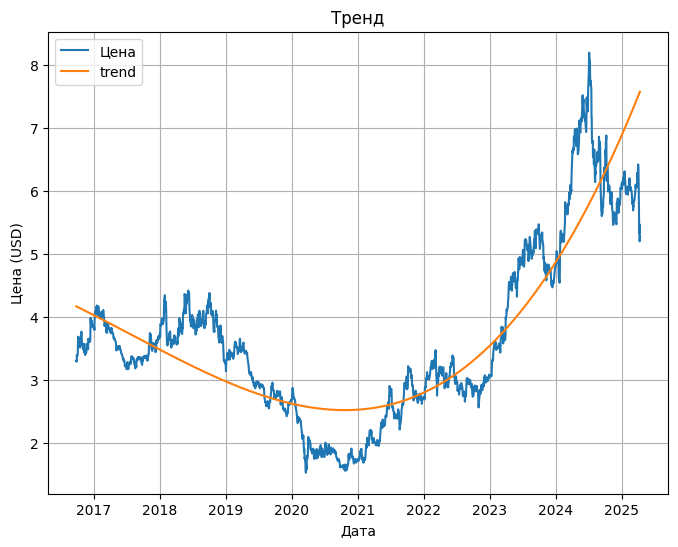

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.83189
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [17]:
crate_base_research_data('share_oil_petrochina_hk', share_oil_petrochina_hk) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                        Обзор датасета: share_oil_equinor_oslo                                                        
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  2153.000000  2153.000000  2153.000000  2153.000000  2153.000000   
mean    195.101134   195.066526   197.330076   193.020212     2.007431   
std      76.897906    76.979982    78.112605    75.965285     1.408267   
min      83.693420    82.025257    86.060806    80.205466     0.000000   
25%     128.276978   128.319968   129.686754   127.116283     1.000000   
50%     160.460968   161.074312   163.260670   159.002310     2.000000   
75%     

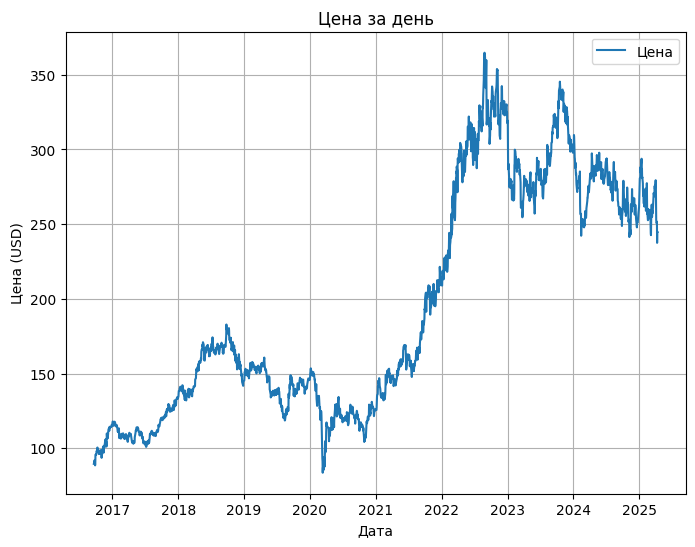

------------------------------------------------------------------------------------------------------------------------------------------------------


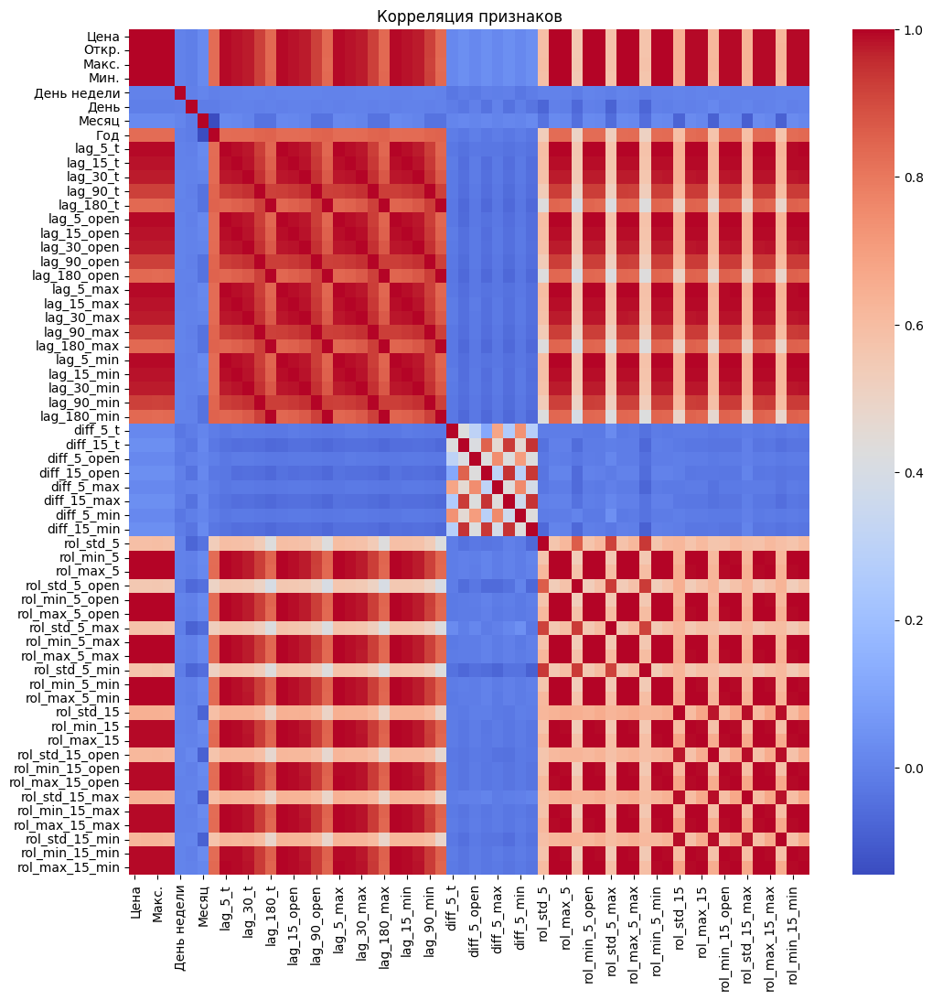

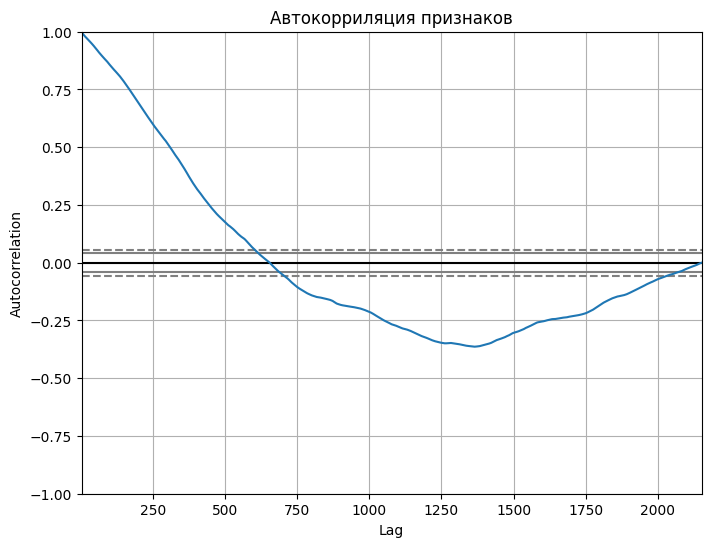

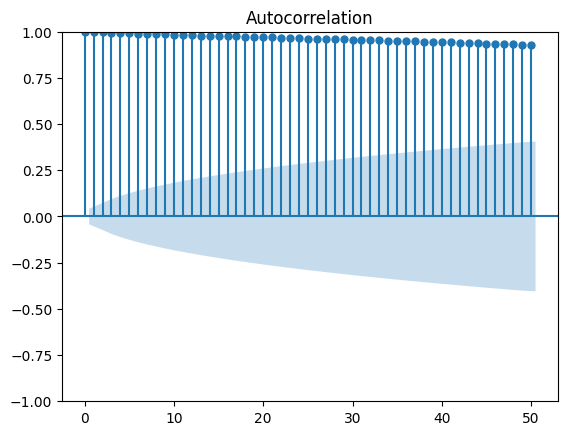

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


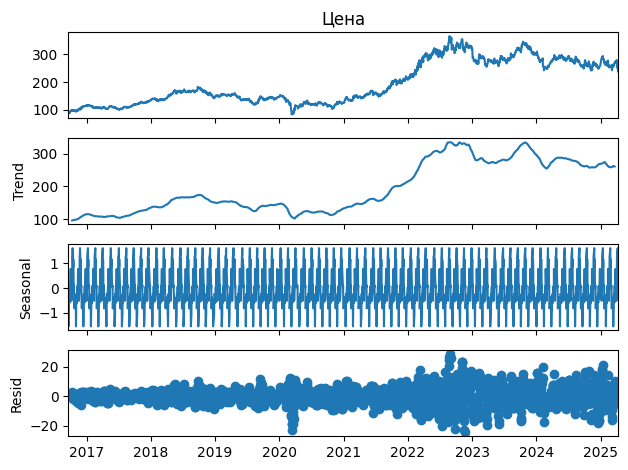

Сезонная декомпозиция ряда, период - 90 дней


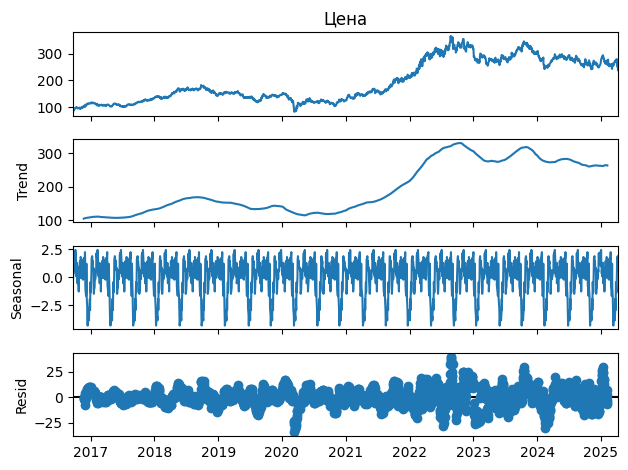

------------------------------------------------------------------------------------------------------------------------------------------------------


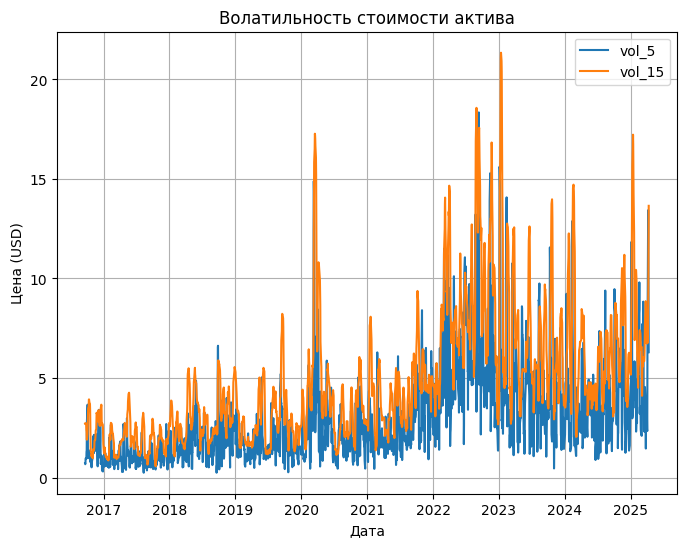

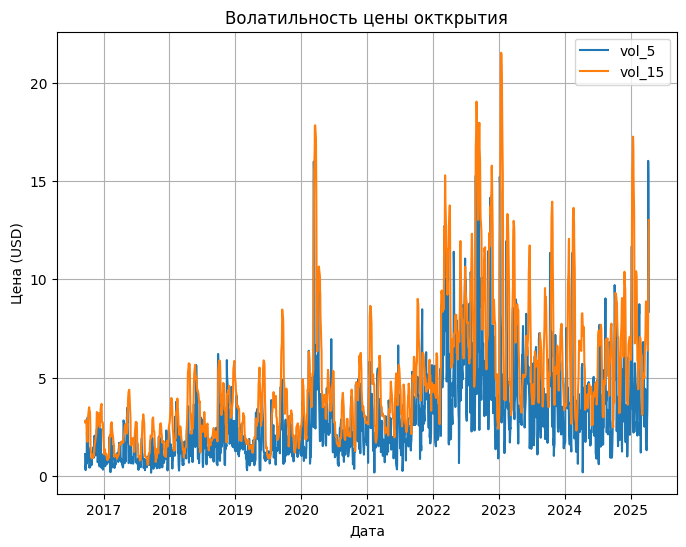

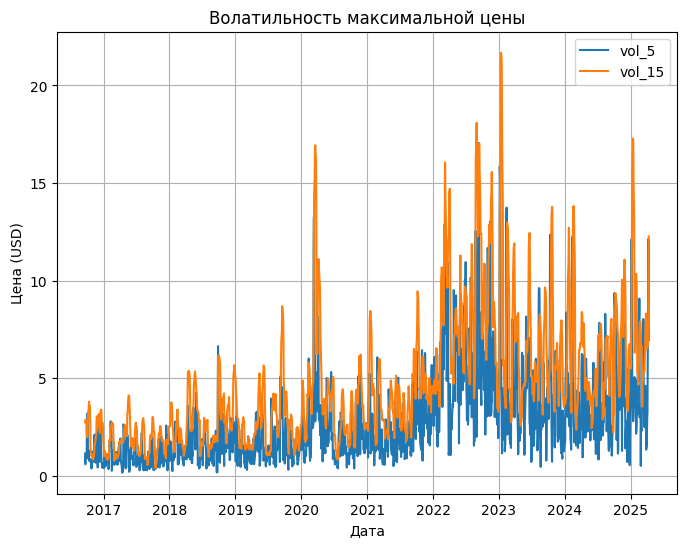

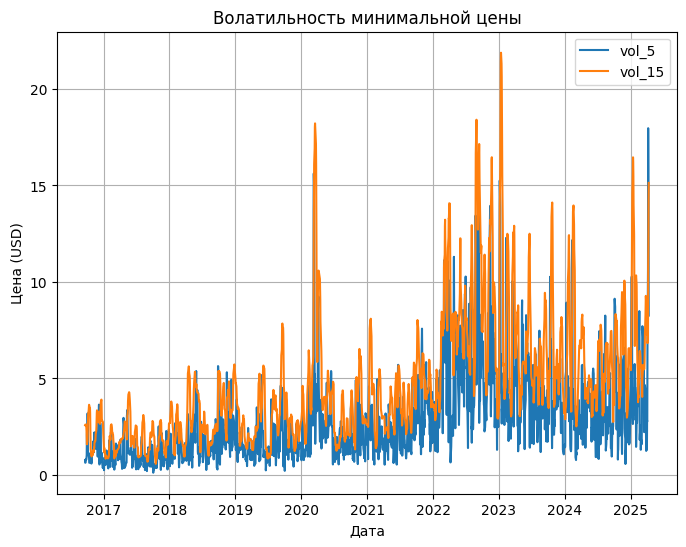

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
0
Обнаружены IQR выбросы:
0
------------------------------------------------------------------------------------------------------------------------------------------------------


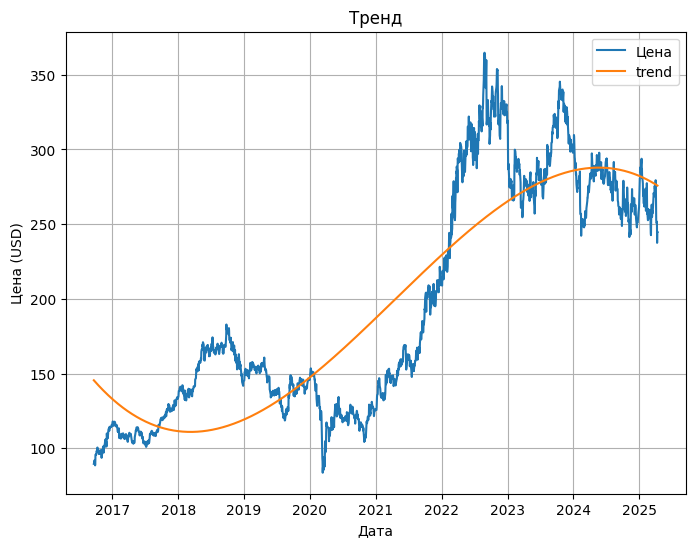

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.66971
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [18]:
crate_base_research_data('share_oil_equinor_oslo', share_oil_equinor_oslo) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                       Обзор датасета: spot_preciouse_metal_AU                                                        
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  2214.000000  2214.000000  2214.000000  2214.000000  2214.000000   
mean   1712.472403  1712.042575  1723.513550  1701.151220     1.997742   
std     412.684276   412.014716   415.947727   408.628111     1.414372   
min    1128.430000  1128.440000  1133.940000  1122.440000     0.000000   
25%    1308.120000  1308.100000  1314.542500  1302.132500     1.000000   
50%    1754.010000  1753.895000  1764.465000  1742.265000     2.000000   
75%    1

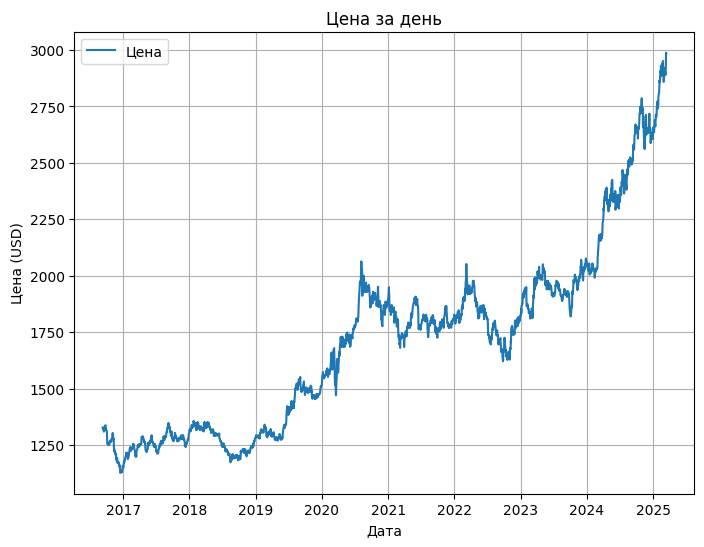

------------------------------------------------------------------------------------------------------------------------------------------------------


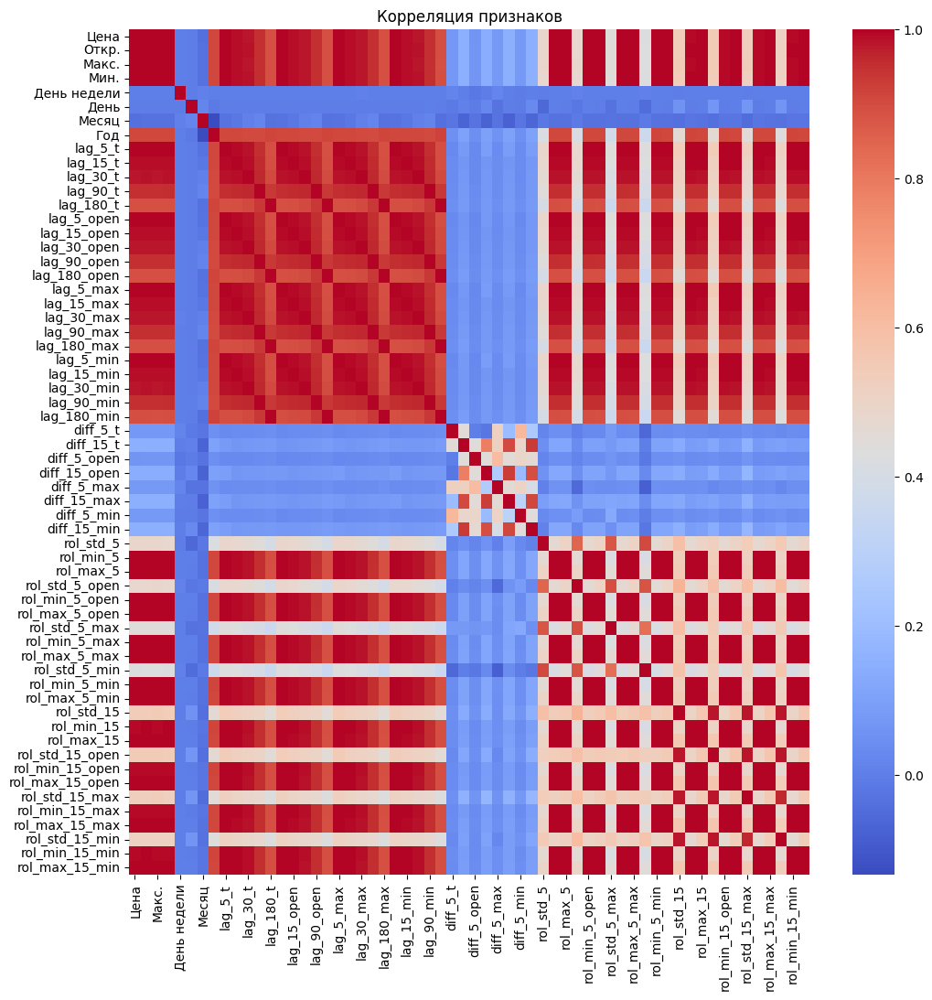

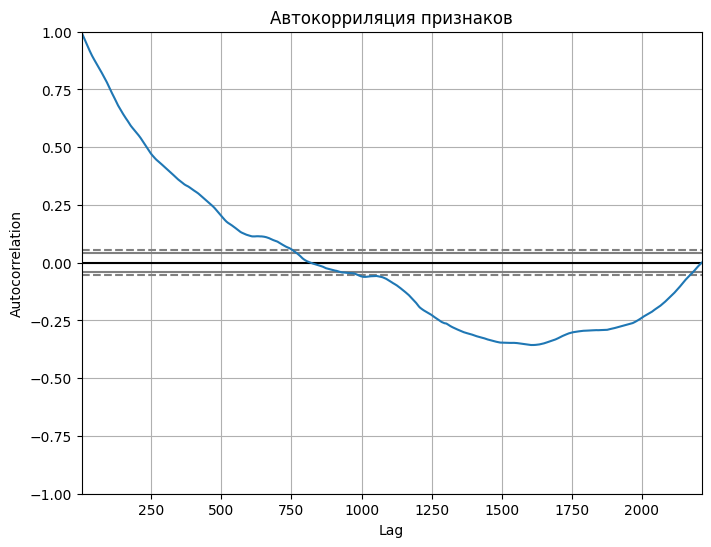

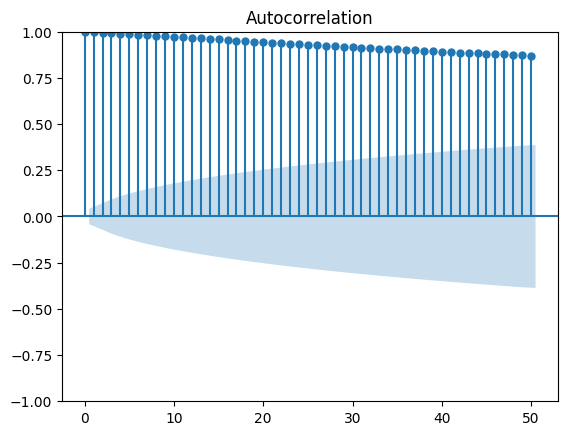

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


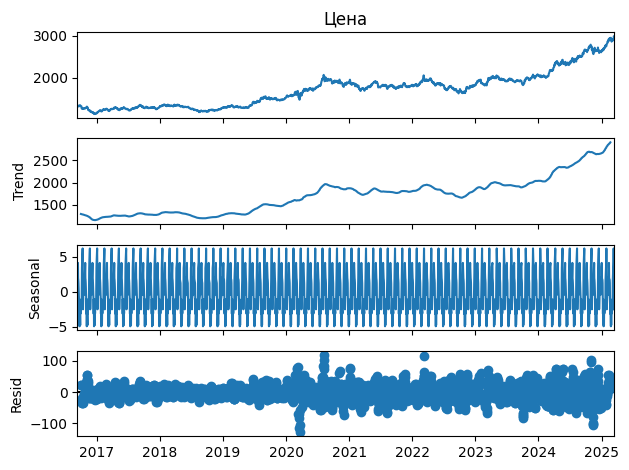

Сезонная декомпозиция ряда, период - 90 дней


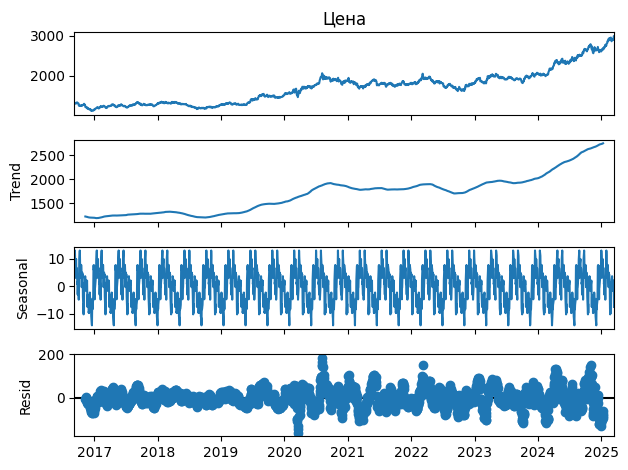

------------------------------------------------------------------------------------------------------------------------------------------------------


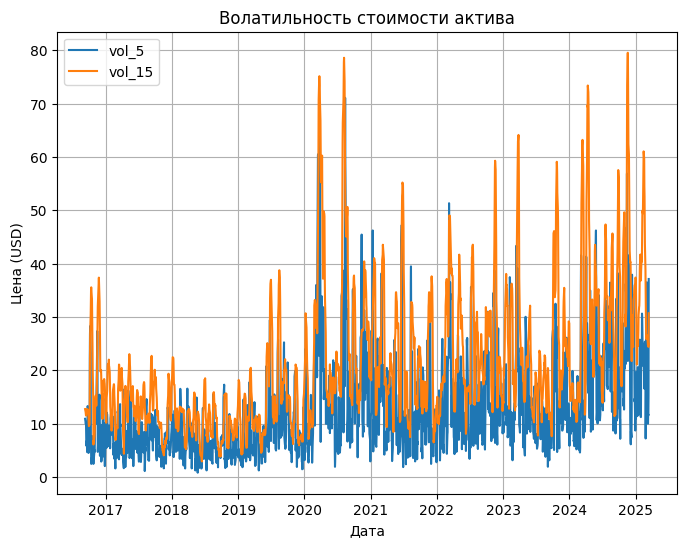

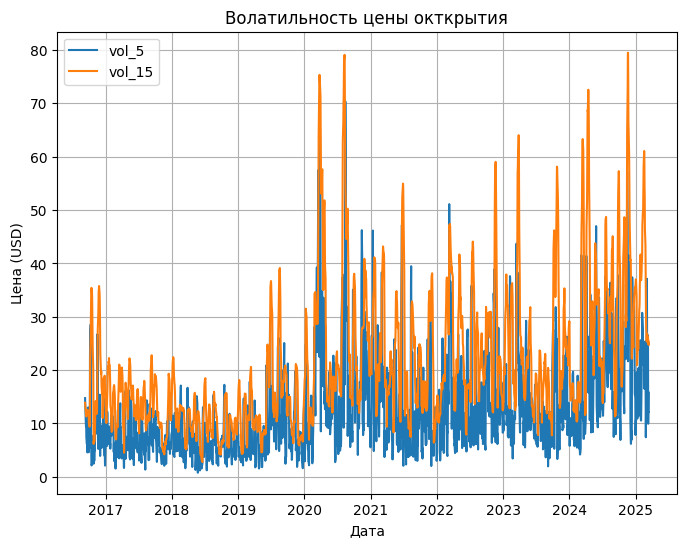

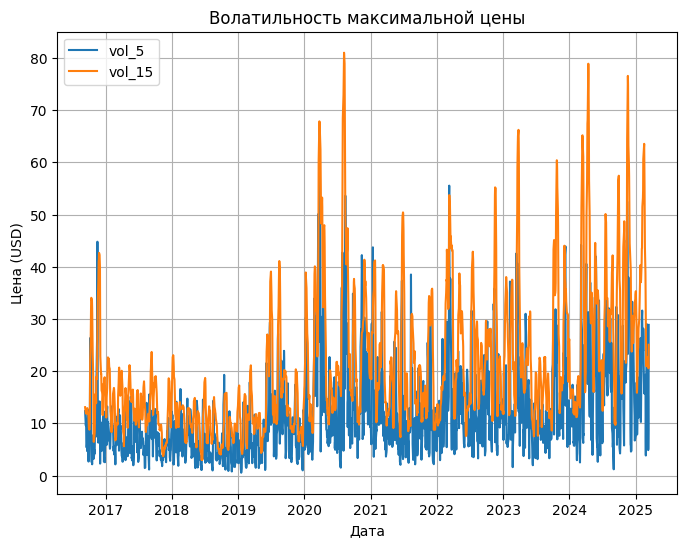

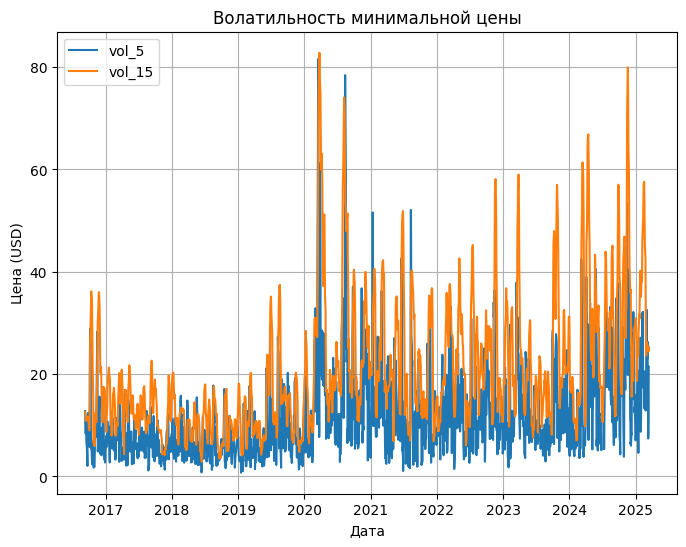

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
3
Обнаружены IQR выбросы:
28
------------------------------------------------------------------------------------------------------------------------------------------------------


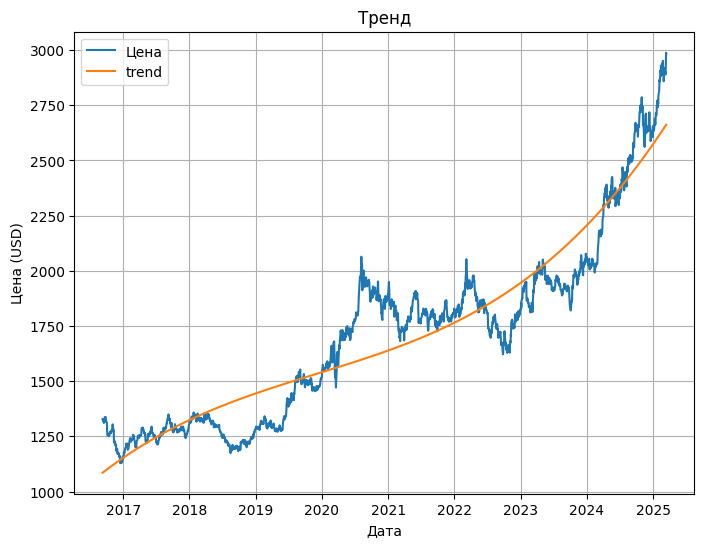

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.99756
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [19]:
crate_base_research_data('spot_preciouse_metal_AU', spot_preciouse_metal_AU) 

------------------------------------------------------------------------------------------------------------------------------------------------------
                                                       Обзор датасета: spot_preciouse_metal_AG                                                        
------------------------------------------------------------------------------------------------------------------------------------------------------
Статистика по данным
              Цена        Откр.        Макс.         Мин.  День недели  \
count  2215.000000  2215.000000  2215.000000  2215.000000  2215.000000   
mean     21.130334    21.134824    21.407701    20.851292     1.998194   
std       4.985376     4.979510     5.078235     4.875014     1.414851   
min      11.980000    11.959800    12.311000    11.640200     0.000000   
25%      16.810000    16.821500    16.997000    16.634500     1.000000   
50%      20.889000    20.844000    21.188000    20.582000     2.000000   
75%     

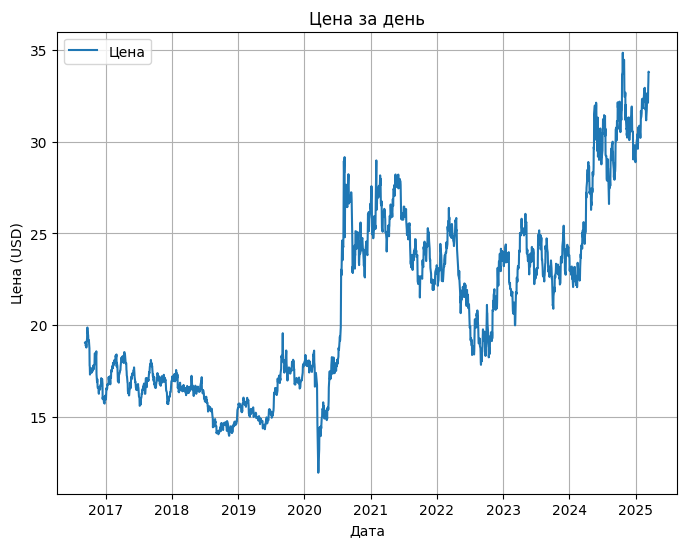

------------------------------------------------------------------------------------------------------------------------------------------------------


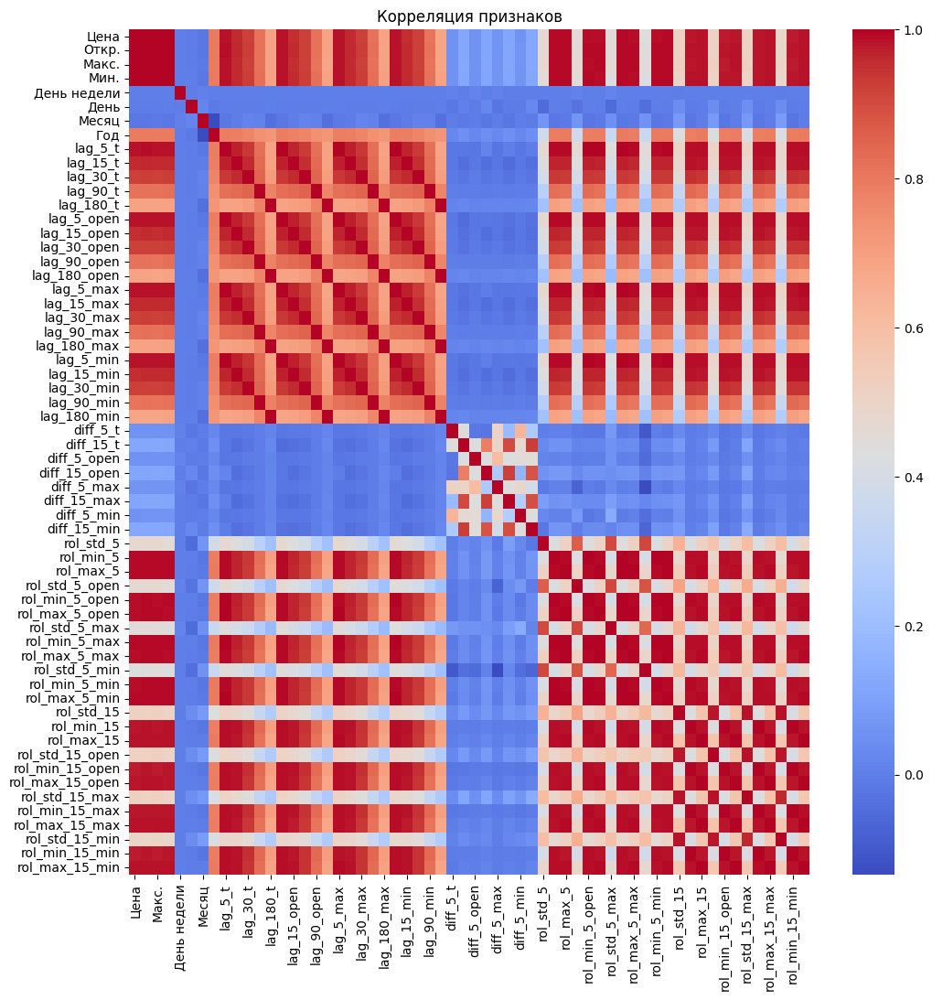

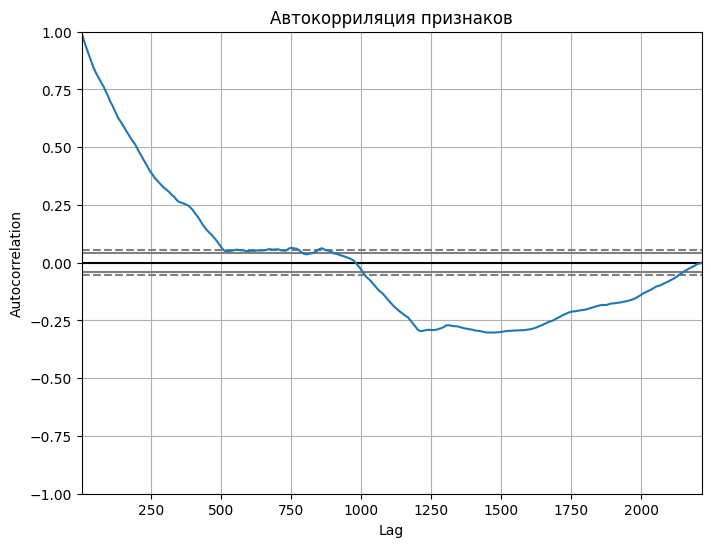

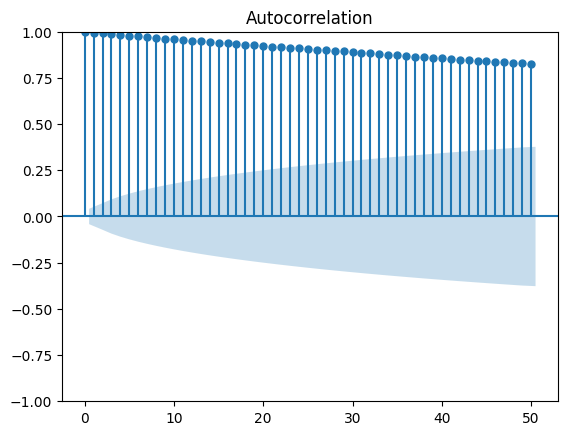

------------------------------------------------------------------------------------------------------------------------------------------------------
Сезонная декомпозиция ряда, период - 30 дней


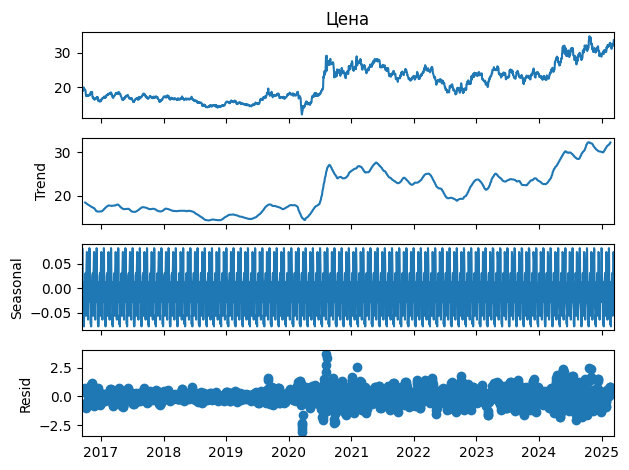

Сезонная декомпозиция ряда, период - 90 дней


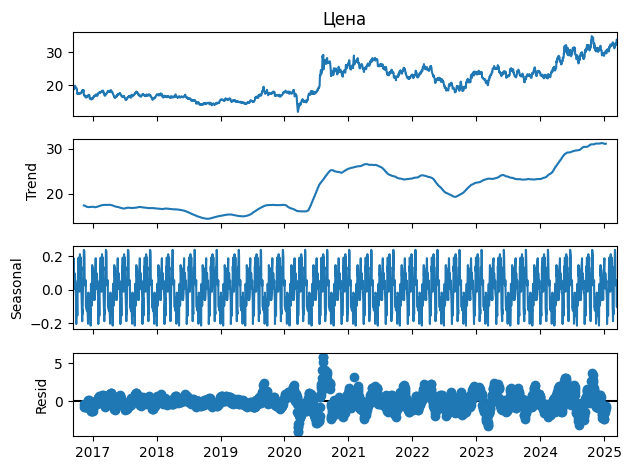

------------------------------------------------------------------------------------------------------------------------------------------------------


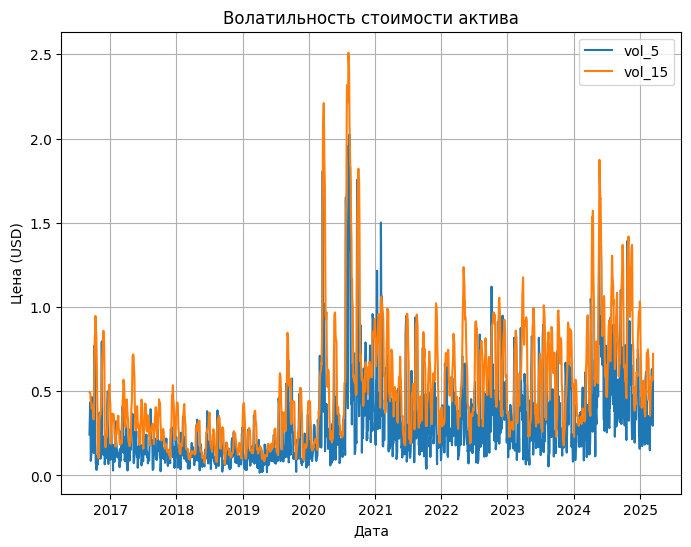

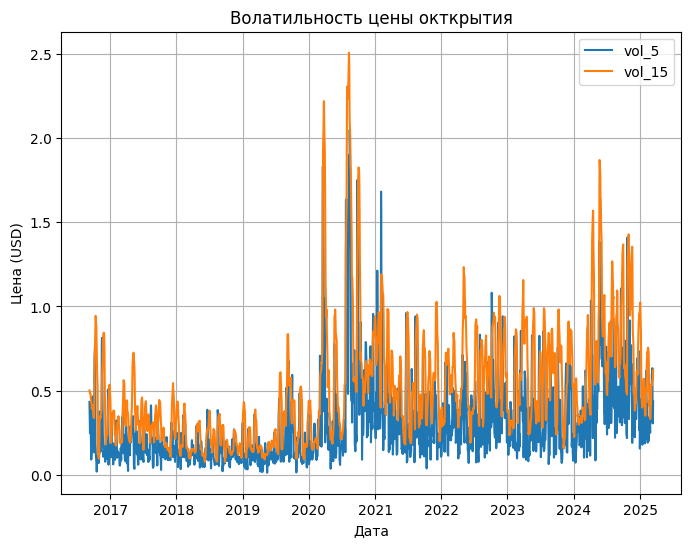

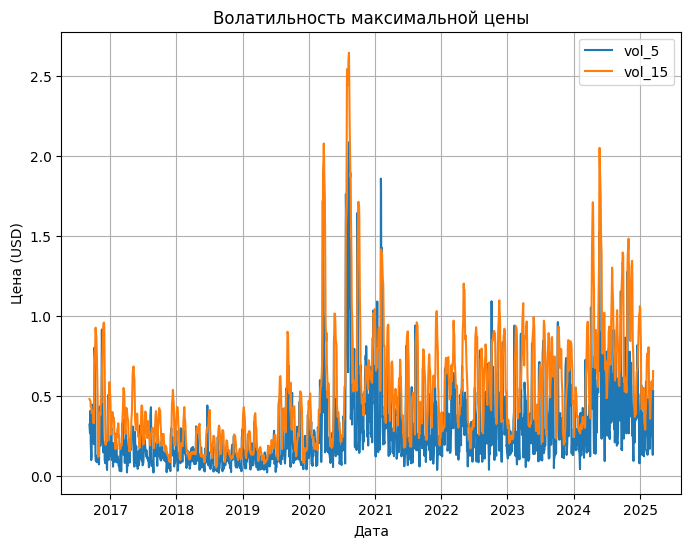

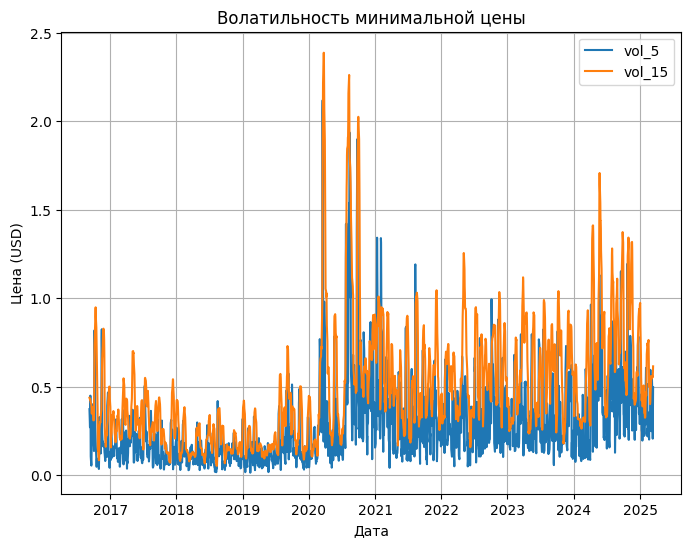

------------------------------------------------------------------------------------------------------------------------------------------------------
Z-score выбросы:
0
Обнаружены IQR выбросы:
0
------------------------------------------------------------------------------------------------------------------------------------------------------


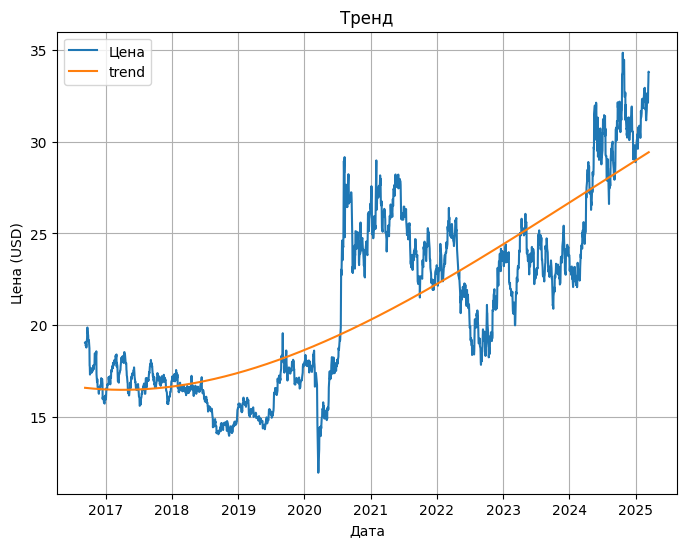

------------------------------------------------------------------------------------------------------------------------------------------------------
p-значение: 0.86164
Ряд НЕ стационарный (p >= 0.05)
------------------------------------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------------------------------------


In [20]:
crate_base_research_data('spot_preciouse_metal_AG', spot_preciouse_metal_AG) 